In [1]:
import numpy as np
import pandas as pd
import os
from IPython.display import display, HTML
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
import joblib

import seaborn as sns
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib
import warnings
from IPython.display import display, HTML
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import numpy as np
import shap 
import lime# SHAP for explainability
from lime.lime_tabular import LimeTabularExplainer  # LIME for local explanations
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import pandas as pd
import time
import copy
import matplotlib.pyplot as plt
import seaborn as sns
import random
import tensorflow as tf





# Configure Jupyter Notebook
pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', 500) 
pd.set_option('display.expand_frame_repr', False)
# pd.set_option('max_colwidth', -1)
display(HTML("<style>div.output_scroll { height: 35em; }</style>"))

reload(plt) #ensures any changes made to matplotlib.pyplot during the session are applied.
%matplotlib inline
%config InlineBackend.figure_format ='retina'

warnings.filterwarnings('ignore')

# configure plotly graph objects
pio.renderers.default = 'iframe'
# pio.renderers.default = 'vscode'

pio.templates["ck_template"] = go.layout.Template(
    layout_colorway = px.colors.sequential.Viridis, 
#     layout_hovermode = 'closest',
#     layout_hoverdistance = -1,
    layout_autosize=False,
    layout_width=800,
    layout_height=600,
    layout_font = dict(family="Calibri Light"),
    layout_title_font = dict(family="Calibri"),
    layout_hoverlabel_font = dict(family="Calibri Light"),
#     plot_bgcolor="white",
)
 
# pio.templates.default = 'seaborn+ck_template+gridon'
pio.templates.default = 'ck_template+gridon'
# pio.templates.default = 'seaborn+gridon'
# pio.templates

c:\Users\tonya\Anaconda3\envs\fl_project_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


label_mapping = {
    "Backdoor": 0,
    "DDoS_HTTP": 1,
    "DDoS_ICMP": 2,
    "DDoS_TCP": 3,
    "DDoS_UDP": 4,
    "Fingerprinting": 5,
    "MITM": 6,
    "Normal": 7,
    "Password": 8,
    "Port_Scanning": 9,
    "Ransomware": 10,
    "SQL_injection": 11,
    "Uploading": 12,
    "Vulnerability_scanner": 13,
    "XSS": 14
}


In [2]:

df_test = pd.read_csv('dataset/test_edge_iiot.csv', low_memory=False)

# Define the number of clients
num_clients = 4

# Split the data horizontally for each client
client_data = {}

for i in range(num_clients):
    client_data[i] = pd.read_csv(f'./dataset/client_{i}_data.csv', low_memory=False)

# Display the shape of each client's data
for client_id, data in client_data.items():
    print(f"Client {client_id} data shape: {data.shape}")

Client 0 data shape: (255706, 69)
Client 1 data shape: (419992, 69)
Client 2 data shape: (186619, 69)
Client 3 data shape: (665419, 69)


label_mapping

    "Backdoor": 0,
    "DDoS_HTTP": 1,
    "DDoS_ICMP": 2,
    "DDoS_TCP": 3,
    "DDoS_UDP": 4,
    "Fingerprinting": 5,
    "MITM": 6,
    "Normal": 7,
    "Password": 8,
    "Port_Scanning": 9,
    "Ransomware": 10,
    "SQL_injection": 11,
    "Uploading": 12,
    "Vulnerability_scanner": 13,
    "XSS": 14


In [3]:
for client_id, data in client_data.items():
    print(f"Client {client_id+1} : {data['Attack_type'].value_counts()}")

Client 1 : Attack_type
7     227418
1      13691
9       3321
12      3007
13      2298
2       1990
0       1756
8       1155
4        667
3        354
5         40
6          9
Name: count, dtype: int64
Client 2 : Attack_type
7     214123
4      72236
2      40878
11     28978
13     24931
0      16517
14     11270
1       4838
9       2197
3       1960
10      1954
12       108
8          2
Name: count, dtype: int64
Client 3 : Attack_type
7     65595
8     30179
12    26368
4     24378
11    10644
1      9212
3      7018
2      5540
13     3883
9      2073
0       905
10      428
14      324
5        72
Name: count, dtype: int64
Client 4 : Attack_type
7     584121
3      30837
1      11137
13      8865
8       8524
9       8365
2       6002
10      5343
11       919
5        579
14       328
6        284
0        103
12        10
4          2
Name: count, dtype: int64


## Modelling and Evaluation

In [4]:
# Initialize an empty DataFrame
model_performance = pd.DataFrame(columns=['Model', 'Accuracy', 'Recall', 'Precision', 'F1-Score', 
                                          'time to train', 'time to predict', 'total time'])

In [5]:
from sklearn.model_selection import train_test_split

# Prepare training and testing sets for each client and scale continuous features
client_train_data = {}
X_test = df_test.drop(columns=['Attack_type','Attack_label'])
y_test = df_test['Attack_type'].values

for i in range(4):
    print(f"\nProcessing Client {i+1}")
    
    # Separate features and target
    X = client_data[i].drop(columns=['Attack_type','Attack_label'])  # All columns except the label
    y = client_data[i]['Attack_type']  # Label column (multiclass encoded)

    # Ensure target is integer-encoded (if not already)
    y = y.astype(int)

    # Split each client's data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=41)
    
    # Store the processed data for each client
    client_train_data[i] = (X, y)

    # Print confirmation of scaling for this client
    print(f"Completed scaling for Client {i+1}")
    print(f"Training set size: {X_train.shape[0]}, Testing set size: {X_test.shape[0]}")



Processing Client 1
Completed scaling for Client 1
Training set size: 178994, Testing set size: 76712

Processing Client 2
Completed scaling for Client 2
Training set size: 293994, Testing set size: 125998

Processing Client 3
Completed scaling for Client 3
Training set size: 130633, Testing set size: 55986

Processing Client 4
Completed scaling for Client 4
Training set size: 465793, Testing set size: 199626


In [6]:
# Display the shape of each client's training and test sets
for i in range(4):
    X_train, y_train = client_train_data[i]
    
    print(f"\nClient {i+1} Data Shapes:")
    print(f"  Training Set - X_train: {X_train.shape}, y_train: {y_train.shape}")
    print(len(y_train.unique()))

print(f"  Test Set - X_test: {X_test.shape}, y_test: {y_test.shape}")
print(len(y_test.unique()))


Client 1 Data Shapes:
  Training Set - X_train: (255706, 67), y_train: (255706,)
12

Client 2 Data Shapes:
  Training Set - X_train: (419992, 67), y_train: (419992,)
13

Client 3 Data Shapes:
  Training Set - X_train: (186619, 67), y_train: (186619,)
14

Client 4 Data Shapes:
  Training Set - X_train: (665419, 67), y_train: (665419,)
15
  Test Set - X_test: (199626, 67), y_test: (199626,)
14


## Neural Network MLP

In [ ]:

# Set Random Seed
seed = 42
np.random.seed(seed)
random.seed(seed)
tf.random.set_seed(seed)

# Configuration
num_rounds = 10 # Number of federated learning rounds
# epoch_schedule = [50, 50, 50, 50, 50, 50, 80, 80, 80, 80]  # Epochs per round
epoch_schedule = [5, 5, 5, 5, 5, 5, 8, 8, 8, 8]  # Epochs per round
hidden_layer_sizes = (20, 20)  # Hidden layer configuration
batch_size = 2000  # Batch size for MLP
learning_rate = 0.001  # Learning rate for MLP

# Global list of all possible classes
all_classes = np.unique(np.concatenate([client_train_data[i][1] for i in range(len(client_train_data))]))



# Initialize global model parameters
global_model = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, 
                             activation='relu', 
                             solver='adam', 
                             batch_size=batch_size, 
                             learning_rate_init=learning_rate, 
                             max_iter=1,  # One iteration per call to `fit`
                             warm_start=True, 
                             verbose=0)

# Perform a dummy fit to initialize the model structure with all classes
X_dummy = np.random.rand(15, client_train_data[0][0].shape[1])  # Random features
y_dummy = np.tile(all_classes, 1)[:15]  # Ensure all classes are present
global_model.fit(X_dummy, y_dummy)  # Dummy fit

# Assign global weights and biases from the initialized model
global_weights = copy.deepcopy(global_model.coefs_)
global_biases = copy.deepcopy(global_model.intercepts_)


### Aggregation Function

In [8]:

# Function to aggregate weights using FedAvg
def fed_avg(weights_list, biases_list):
    avg_weights = [np.mean([w[layer] for w in weights_list], axis=0) for layer in range(len(global_weights))]
    avg_biases = [np.mean([b[layer] for b in biases_list], axis=0) for layer in range(len(global_biases))]
    return avg_weights, avg_biases


In [9]:
# Store performance metrics
round_performance = []
os.makedirs("saved_models", exist_ok=True)
# Federated Learning Rounds
for round_num in range(1, num_rounds + 1):
    print(f"\n--- FL Round {round_num} ---")
    
    # Determine the number of epochs for this round
    num_epochs = epoch_schedule[round_num - 1]
    print(f"Number of epochs for this round: {num_epochs}")
    
    start_round = time.time()
    client_weights = []
    client_biases = []
    round_train_time = 0  # Total training time for all clients

    # Local Training on Clients
    for i in range(len(client_train_data)):  # Iterate over each client
        print(f"\nTraining model for Client {i + 1}")
        X_train, y_train = client_train_data[i]

        # Add dummy samples to ensure all classes are present
        missing_classes = set(all_classes) - set(y_train)
        if missing_classes:
            print(f"  Adding dummy samples for missing classes: {missing_classes}")
            dummy_X = np.zeros((len(missing_classes), X_train.shape[1]))  # Dummy features (zeros)
            dummy_y = np.array(list(missing_classes))  # Dummy labels
            X_train = np.vstack([X_train, dummy_X])
            y_train = np.hstack([y_train, dummy_y])

        # Initialize the local model with global weights and biases
        local_model = copy.deepcopy(global_model)  # Copy the global model
        local_model.coefs_ = copy.deepcopy(global_weights)
        local_model.intercepts_ = copy.deepcopy(global_biases)

        # Train the local model for multiple epochs
        for epoch in range(num_epochs):
            local_model.fit(X_train, y_train)  # Train for one epoch
            round_train_time += (time.time() - start_round)

        # Store the local model weights and biases
        client_weights.append(local_model.coefs_)
        client_biases.append(local_model.intercepts_)

        # Evaluate the local model
        y_pred = local_model.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average="weighted")
        recall = recall_score(y_test, y_pred, average="weighted")
        f1 = f1_score(y_test, y_pred, average="weighted")

        print(f"Client {i + 1} - Accuracy: {accuracy:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1-Score: {f1:.4f} , Train Time: {round_train_time:.4f}")

        # ✅ Save last version of each local model (in the last round only)
        if round_num == num_rounds:
            model_path = f"saved_models/client_{i + 1}_final.joblib"
            joblib.dump(local_model, model_path)
            print(f"✅ Saved final model for Client {i + 1} at {model_path}")


        # Plot the confusion matrix for this client
        cm = confusion_matrix(y_test, y_pred, labels=all_classes)
        # disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=all_classes)
        # disp.plot(cmap="Blues")
        # plt.title(f"Confusion Matrix - Client {i + 1} - Round {round_num}")
        # plt.show()

        # Store performance metrics for this round and client
        round_performance.append({
            "Round": round_num,
            "Client": f"Client {i + 1}",
            "Accuracy": accuracy,
            "Precision": precision,
            "Recall": recall,
            "F1-Score": f1,
            "Train Time": round_train_time,
        })

    # Aggregate Weights and Biases (FedAvg)
    global_weights, global_biases = fed_avg(client_weights, client_biases)

    # ✅ Update the global model (fix)
    global_model.coefs_ = copy.deepcopy(global_weights)
    global_model.intercepts_ = copy.deepcopy(global_biases)
    if round_num == num_rounds:
        global_model_path = f"saved_models/global_final.joblib"
        joblib.dump(global_model, global_model_path)
        print(f"✅ Saved final global model at {global_model_path}")




--- FL Round 1 ---
Number of epochs for this round: 5

Training model for Client 1
  Adding dummy samples for missing classes: {np.int64(10), np.int64(11), np.int64(14)}
Client 1 - Accuracy: 0.9575, Precision: 0.9797, Recall: 0.9575, F1-Score: 0.9601 , Train Time: 9.6375

Training model for Client 2
  Adding dummy samples for missing classes: {np.int64(5), np.int64(6)}
Client 2 - Accuracy: 0.9704, Precision: 0.9772, Recall: 0.9704, F1-Score: 0.9704 , Train Time: 42.1198

Training model for Client 3
  Adding dummy samples for missing classes: {np.int64(6)}
Client 3 - Accuracy: 0.9858, Precision: 0.9850, Recall: 0.9858, F1-Score: 0.9852 , Train Time: 95.3564

Training model for Client 4
Client 4 - Accuracy: 0.9960, Precision: 0.9960, Recall: 0.9960, F1-Score: 0.9951 , Train Time: 190.7432

--- FL Round 2 ---
Number of epochs for this round: 5

Training model for Client 1
  Adding dummy samples for missing classes: {np.int64(10), np.int64(11), np.int64(14)}
Client 1 - Accuracy: 0.9813, P

In [11]:
round_performance

[{'Round': 1,
  'Client': 'Client 1',
  'Accuracy': 0.9575255728211756,
  'Precision': 0.9797324179677458,
  'Recall': 0.9575255728211756,
  'F1-Score': 0.9601368015001049,
  'Train Time': 9.637495279312134},
 {'Round': 1,
  'Client': 'Client 2',
  'Accuracy': 0.9704447316481821,
  'Precision': 0.9771722108394421,
  'Recall': 0.9704447316481821,
  'F1-Score': 0.9704329683539445,
  'Train Time': 42.11980628967285},
 {'Round': 1,
  'Client': 'Client 3',
  'Accuracy': 0.9858084618236101,
  'Precision': 0.9849711625333469,
  'Recall': 0.9858084618236101,
  'F1-Score': 0.9851854197540687,
  'Train Time': 95.35640025138855},
 {'Round': 1,
  'Client': 'Client 4',
  'Accuracy': 0.9959975153537114,
  'Precision': 0.9959980886709221,
  'Recall': 0.9959975153537114,
  'F1-Score': 0.9951465240283286,
  'Train Time': 190.743248462677},
 {'Round': 2,
  'Client': 'Client 1',
  'Accuracy': 0.9813100497931131,
  'Precision': 0.9856339746672435,
  'Recall': 0.9813100497931131,
  'F1-Score': 0.9824941877

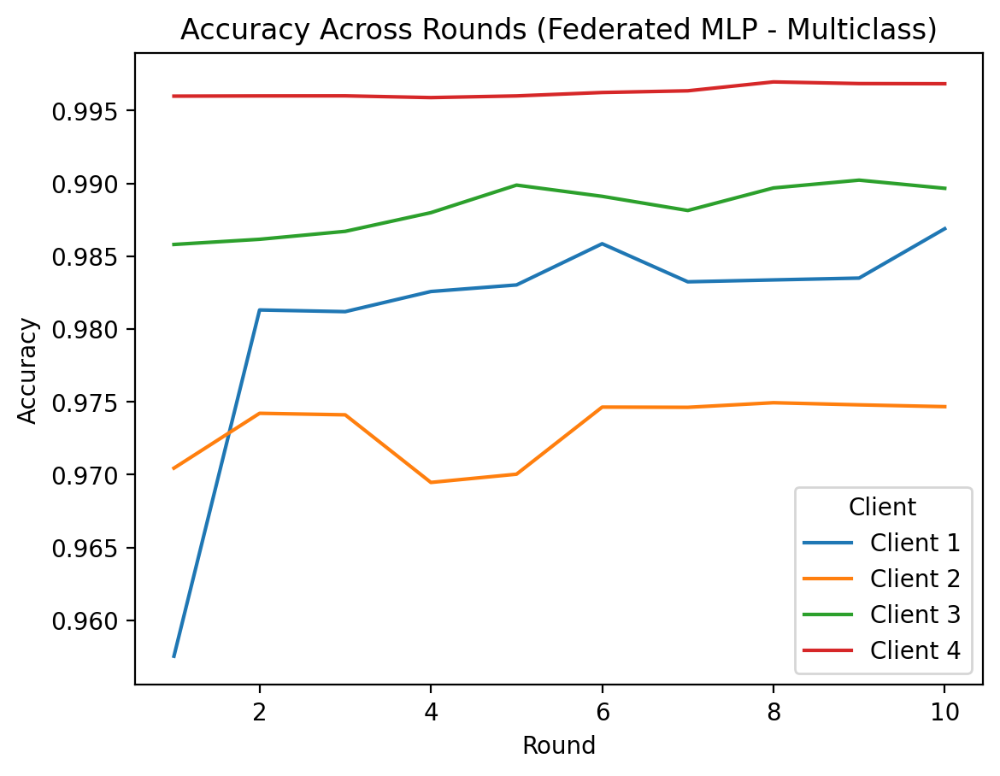

In [12]:

# === Performance Visualization ===
round_performance_df = pd.DataFrame(round_performance)
sns.lineplot(data=round_performance_df, x="Round", y="Accuracy", hue="Client")
plt.title("Accuracy Across Rounds (Federated MLP - Multiclass)")
plt.show()


Confusion Matrix for Global Model:
[[    34      0      0      0      0      0      0      0      0      0
       0      0      0      0      0]
 [     0   3318      0      0      0      0      0      0      0      0
       0      0      0     82      0]
 [     0      0   1808      0      0      0      0      0      0      0
       0      0      0      0      0]
 [     0      0      0   9226      0      0      0      0      0      0
       0      0      0      0      0]
 [     0      0      0      0      0      0      0      0      0      0
       0      0      0      0      0]
 [    24      0     68      0      0     59      0      0      0     38
       0      0      0      0      0]
 [     0      6     16      0      0      0     64      0      1      0
       0      0      0      0      0]
 [     0      0      0      0      0      0      0 175161      0      0
       0      0      0      0      0]
 [     0      0      0      0      0      0      0      0   1806      0
       0    

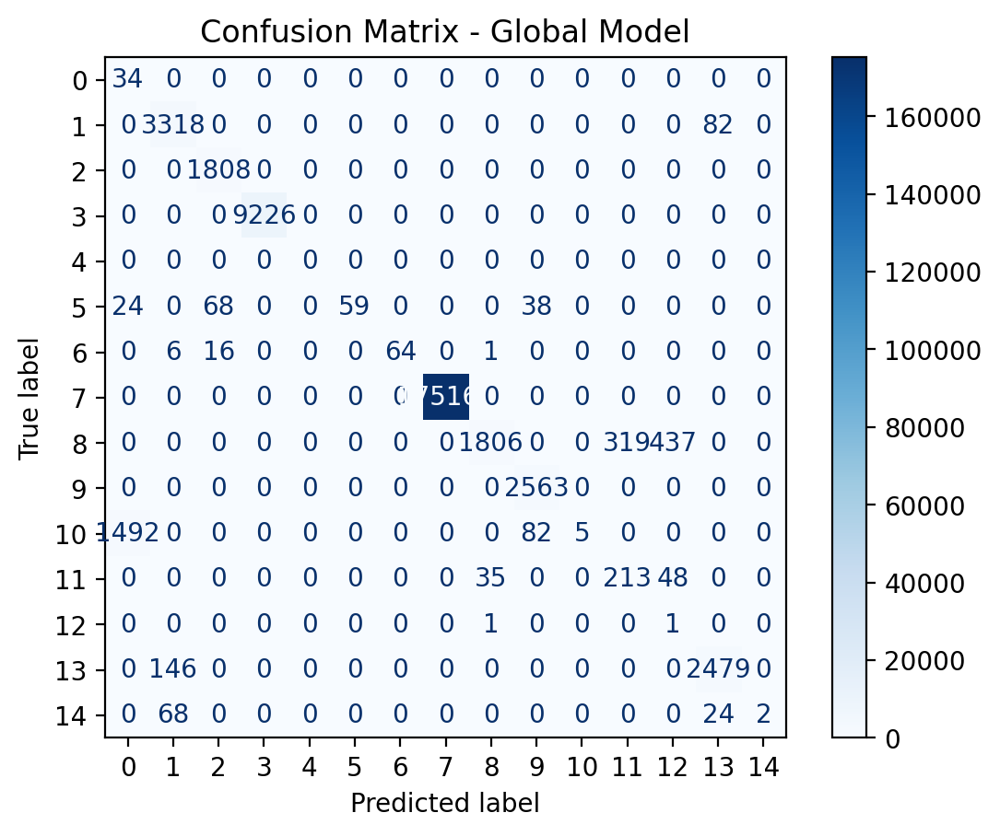

In [15]:
import time
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

# After all federated learning rounds have completed

# Set final global model weights
global_model.coefs_ = global_weights
global_model.intercepts_ = global_biases


# Predict with the global model and measure prediction time
start_time = time.time()
y_pred_global = global_model.predict(X_test)
end_time = time.time()
prediction_time = end_time - start_time

# Compute evaluation metrics
accuracy = accuracy_score(y_test, y_pred_global)
precision = precision_score(y_test, y_pred_global, average='macro', zero_division=0)
recall = recall_score(y_test, y_pred_global, average='macro', zero_division=0)
f1 = f1_score(y_test, y_pred_global, average='macro', zero_division=0)

cm_global = confusion_matrix(y_test, y_pred_global, labels=all_classes)

# Print metrics
print(f"\nConfusion Matrix for Global Model:\n{cm_global}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision (macro): {precision:.4f}")
print(f"Recall (macro): {recall:.4f}")
print(f"F1 Score (macro): {f1:.4f}")
print(f"Prediction Time: {prediction_time:.4f} seconds")

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm_global, display_labels=all_classes)
disp.plot(cmap="Blues")
plt.title("Confusion Matrix - Global Model")
plt.show()



In [16]:
loaded_model = joblib.load("saved_models/global_final.joblib")

In [18]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# === LIME Explainability for Centralized Model ===
print(f"\nGenerating LIME explanations for a sample prediction...")

# try:
# Define LIME Explainer
lime_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X_train.columns.tolist(),
    class_names=[str(cls) for cls in np.unique(y_test)],
    mode="classification"
)

# Generate explanation for a sample instance (e.g., first test instance)
sample_idx = 4  # You can change this to any index
sample_instance = X_test.iloc[sample_idx].values

# Generate explanation
explanation = lime_explainer.explain_instance(
    sample_instance,
    loaded_model.predict_proba,  # Assuming 'model' is your trained model
    num_features=len(X_train.columns),  # Show all features
    top_labels=len(np.unique(y_test))   # Show all classes
)

# Display explanation in notebook
explanation.show_in_notebook(show_table=True)

# Optional: Save as HTML
explanation.save_to_file('lime_explanation.html')

# Print feature importance for the predicted class
predicted_class = loaded_model.predict([sample_instance])[0]
print(f"\nActual label: {y_test.iloc[sample_idx]}")
print(f"Predicted label: {predicted_class}")
print(f"Prediction probability: {loaded_model.predict_proba([sample_instance])[0]}")

# Get feature importance as list
exp_list = explanation.as_list(label=predicted_class)
print(f"\nTop feature contributions for predicted class {predicted_class}:")
for feature, importance in exp_list[:5]:  # Top 5 features
    print(f"  {feature}: {importance:.4f}")
        
# except Exception as e:
#     print(f"Error generating LIME explanation: {e}")
#     print("Make sure you have:")
#     print("- X_train, X_test, y_test defined")
#     print("- A trained model with predict_proba method")
#     print("- LIME library installed: pip install lime")


Generating LIME explanations for a sample prediction...



Actual label: 7
Predicted label: 7
Prediction probability: [3.22901354e-13 3.20819369e-13 5.02535276e-16 1.09711149e-59
 5.85310013e-17 1.10592029e-20 1.85476090e-29 1.00000000e+00
 5.79689385e-23 1.36431551e-29 1.31167528e-15 2.60081769e-48
 1.82937460e-15 3.80264342e-41 2.95213574e-43]

Top feature contributions for predicted class 7:
  http.response <= -0.13: 0.6484
  icmp.checksum <= -0.19: 0.3908
  tcp.connection.rst <= -0.22: 0.3251
  http.content_length <= -0.05: 0.2329
  icmp.seq_le <= -0.21: 0.1862



Generating SHAP explanations...
Creating background summary with 100 samples...
Model has 15 classes
Explaining first 15 classes...

Explaining class 0...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.10it/s]


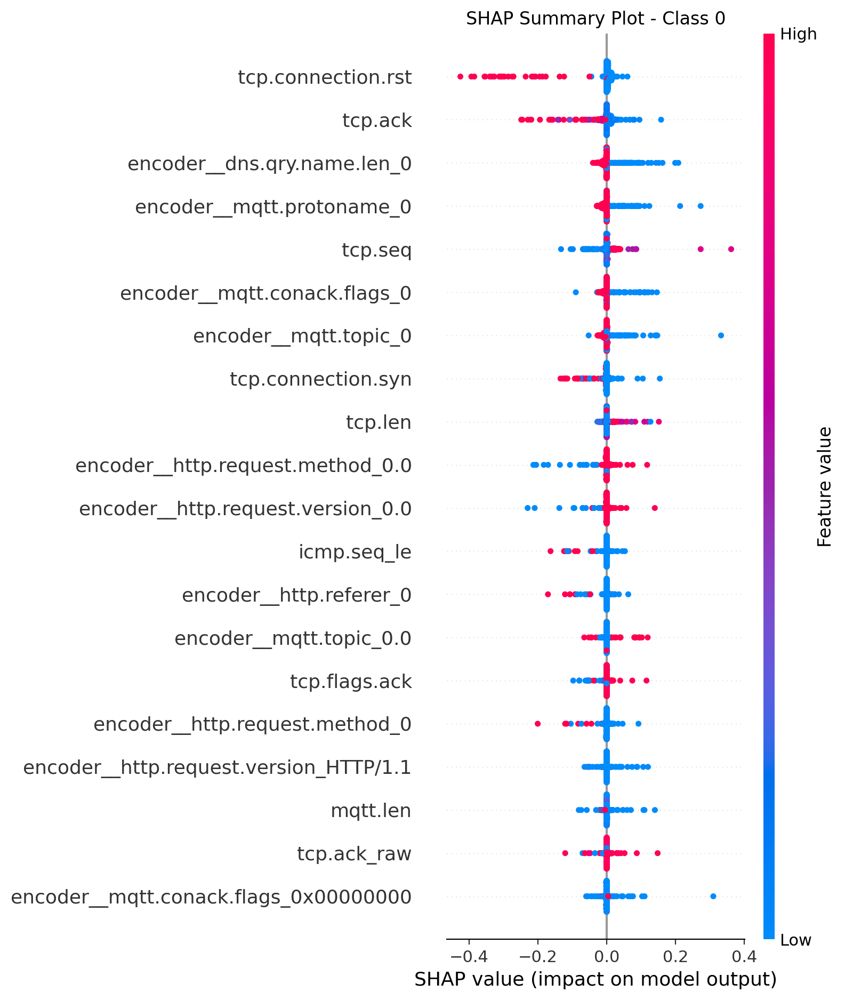

Creating waterfall plot for class 0...


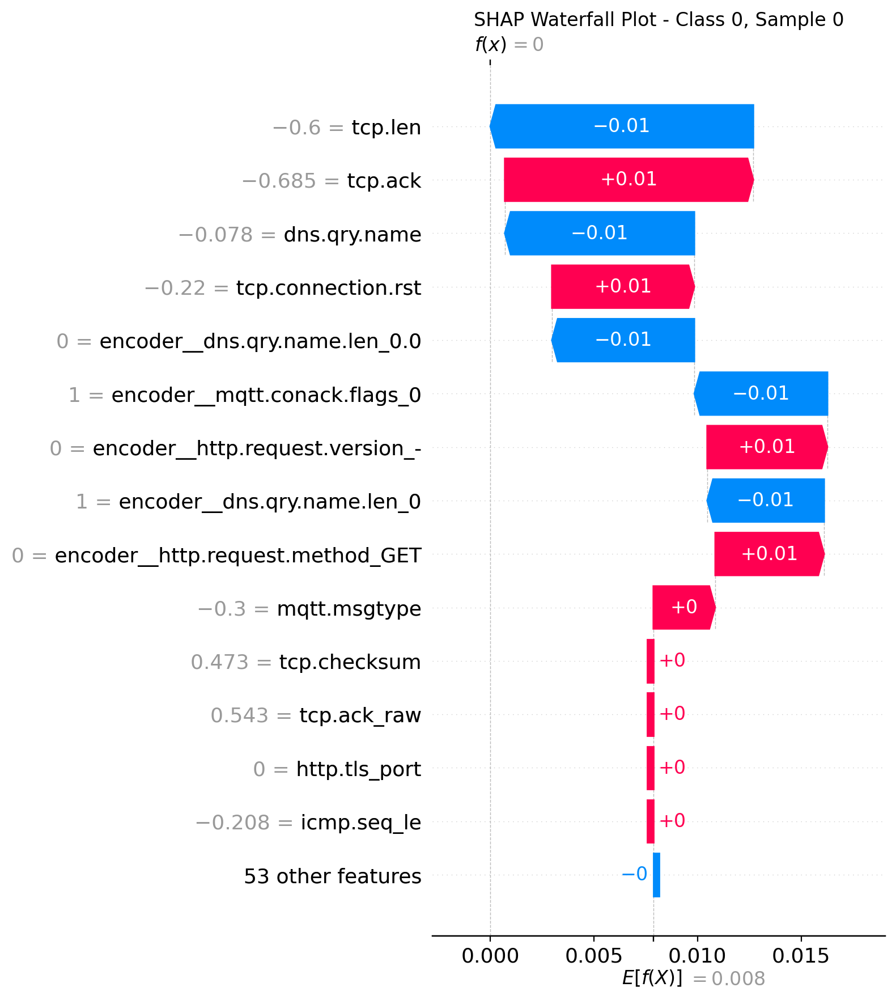


Explaining class 1...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 62.38it/s]


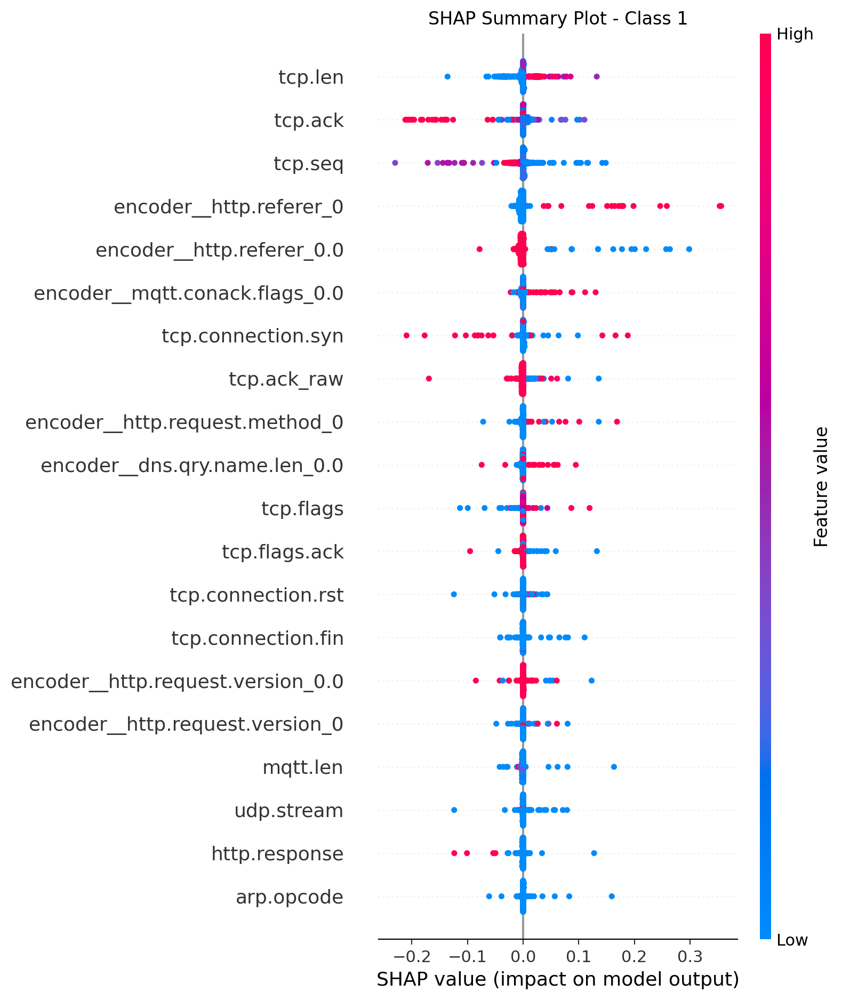

Creating waterfall plot for class 1...


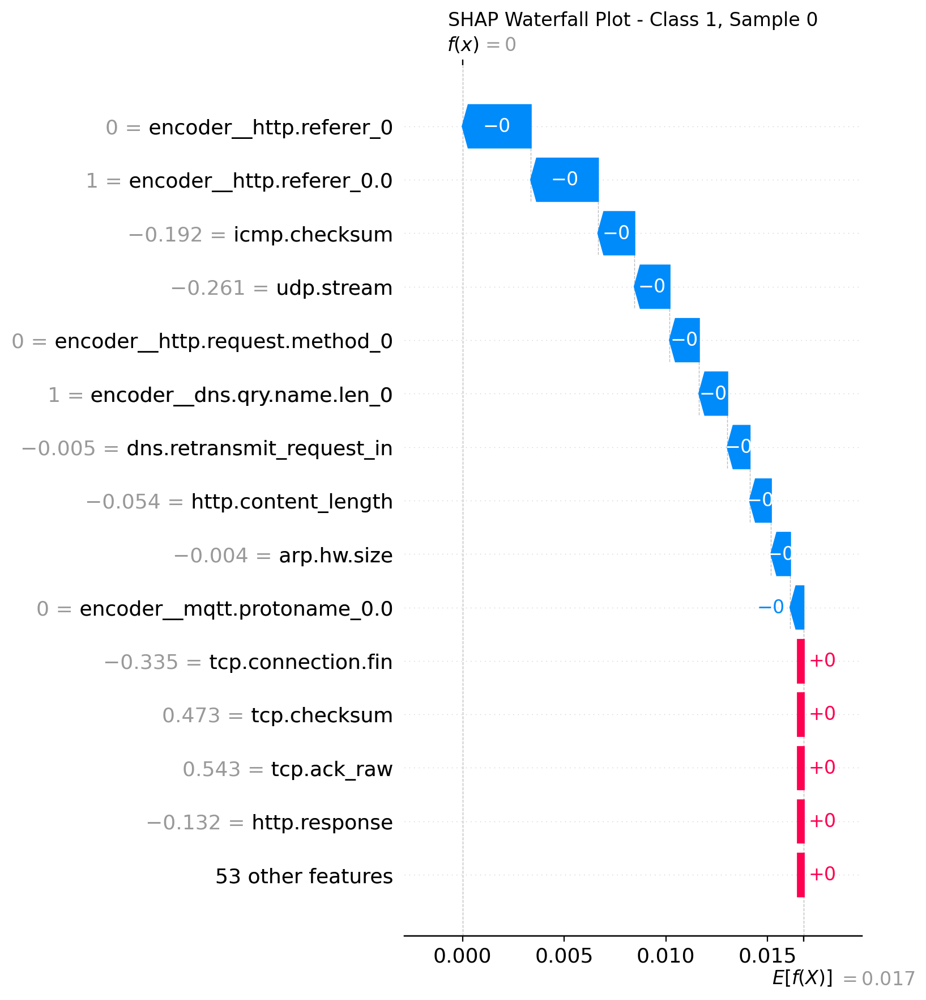


Explaining class 2...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.19it/s]


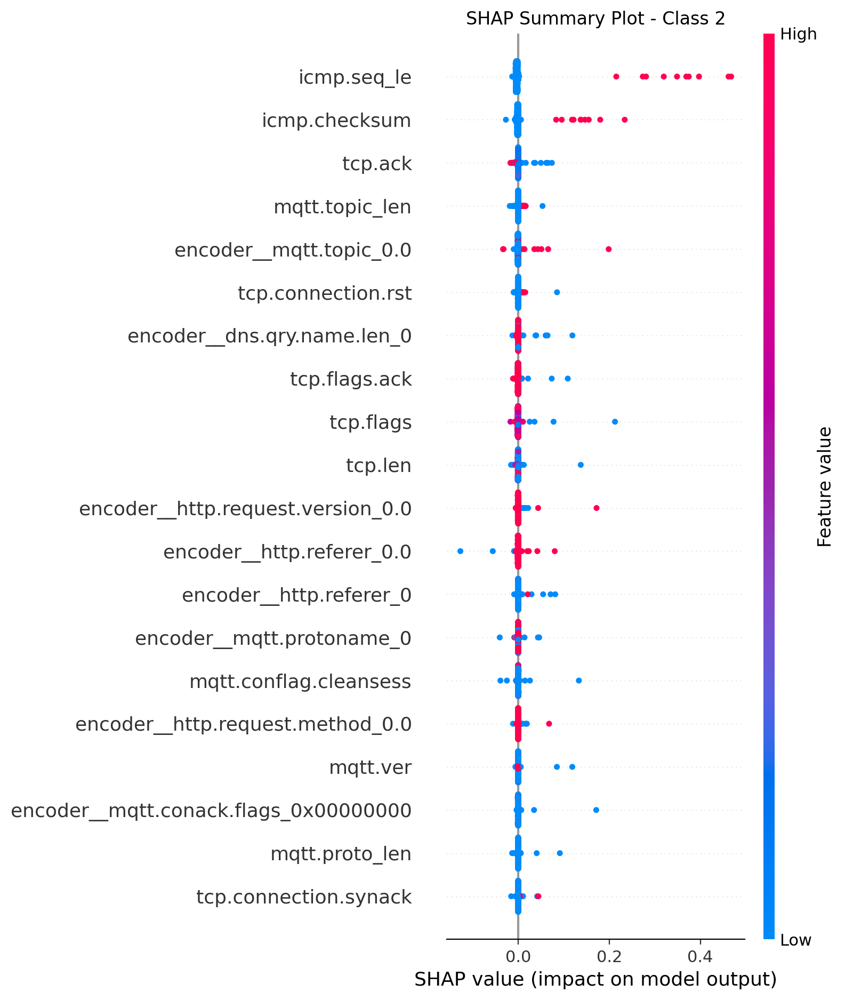

Creating waterfall plot for class 2...


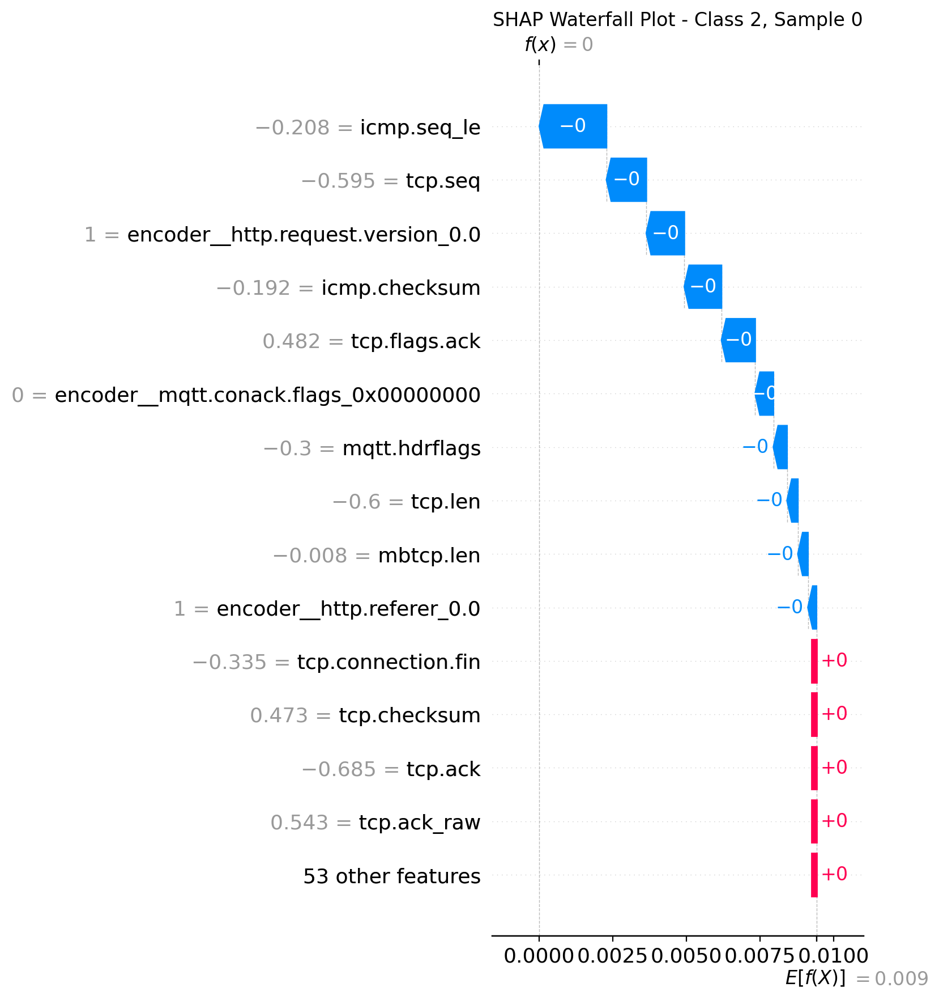


Explaining class 3...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.58it/s]


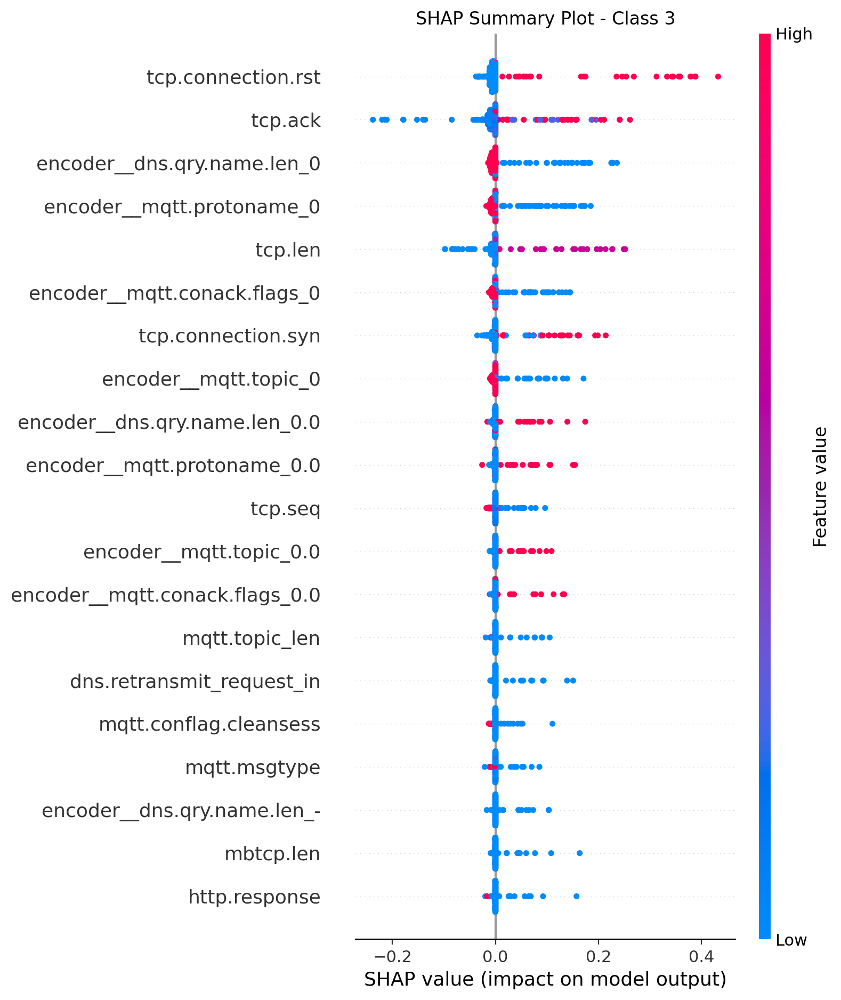

Creating waterfall plot for class 3...


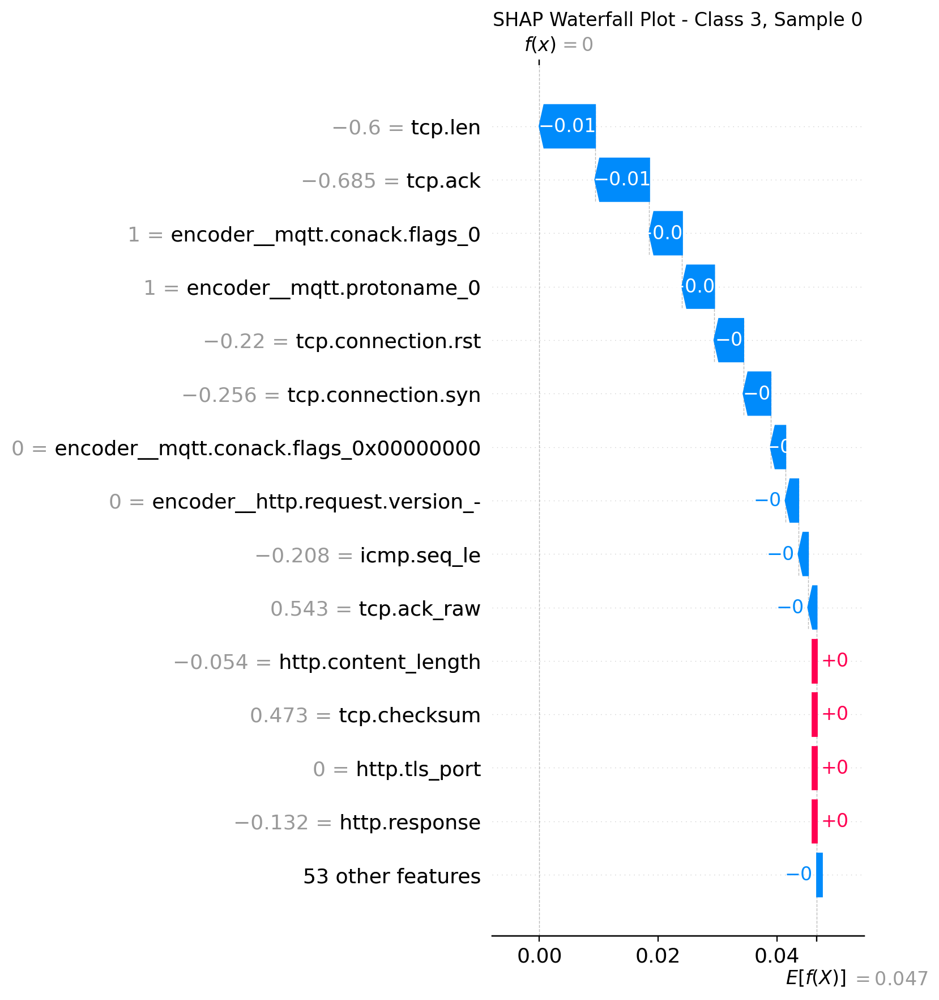


Explaining class 4...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 62.40it/s]


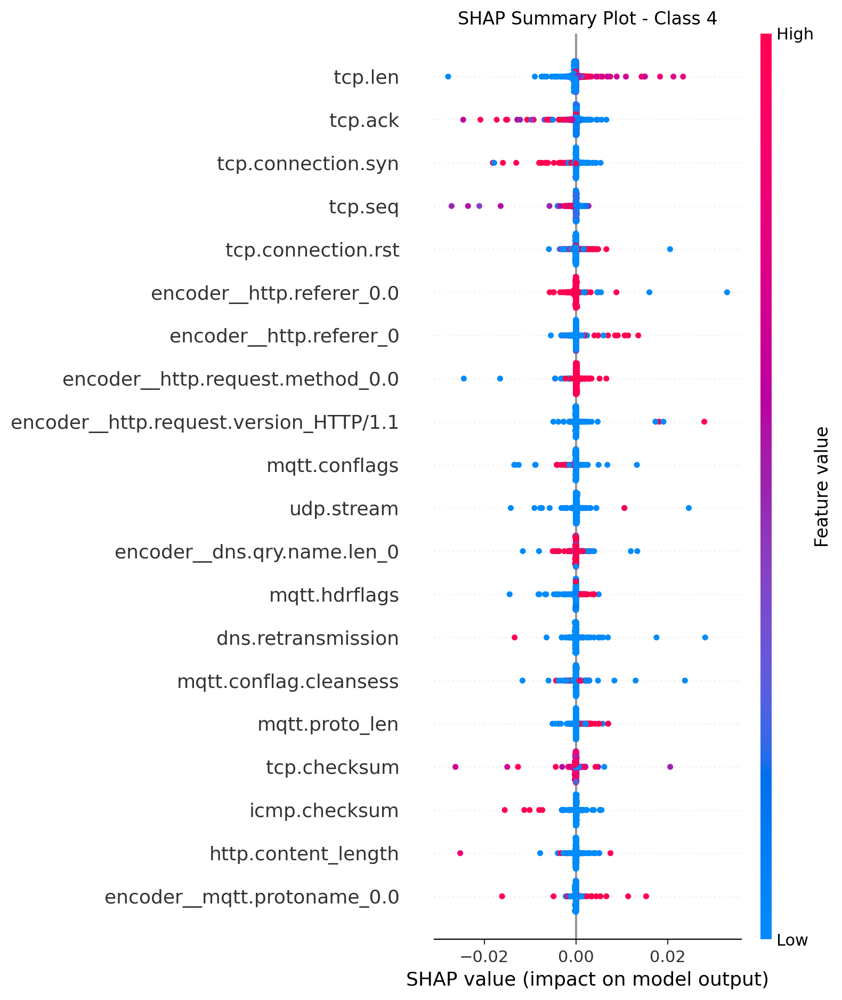

Creating waterfall plot for class 4...


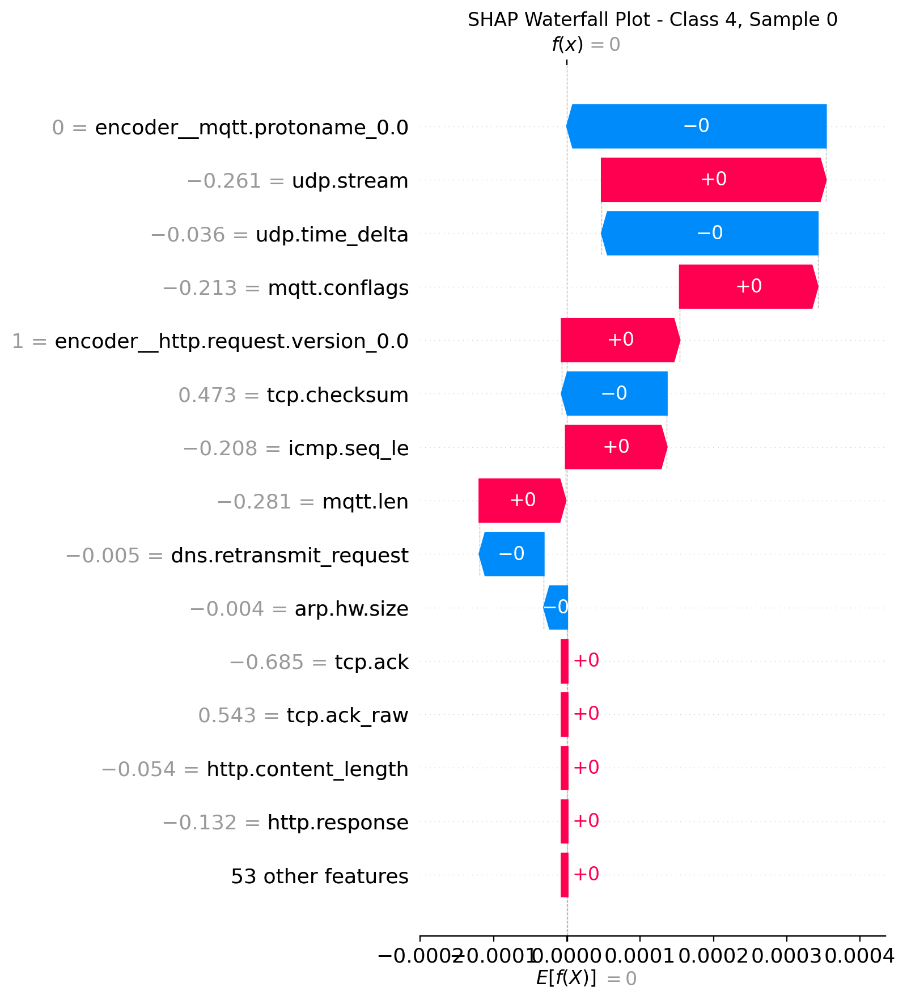


Explaining class 5...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 63.48it/s]


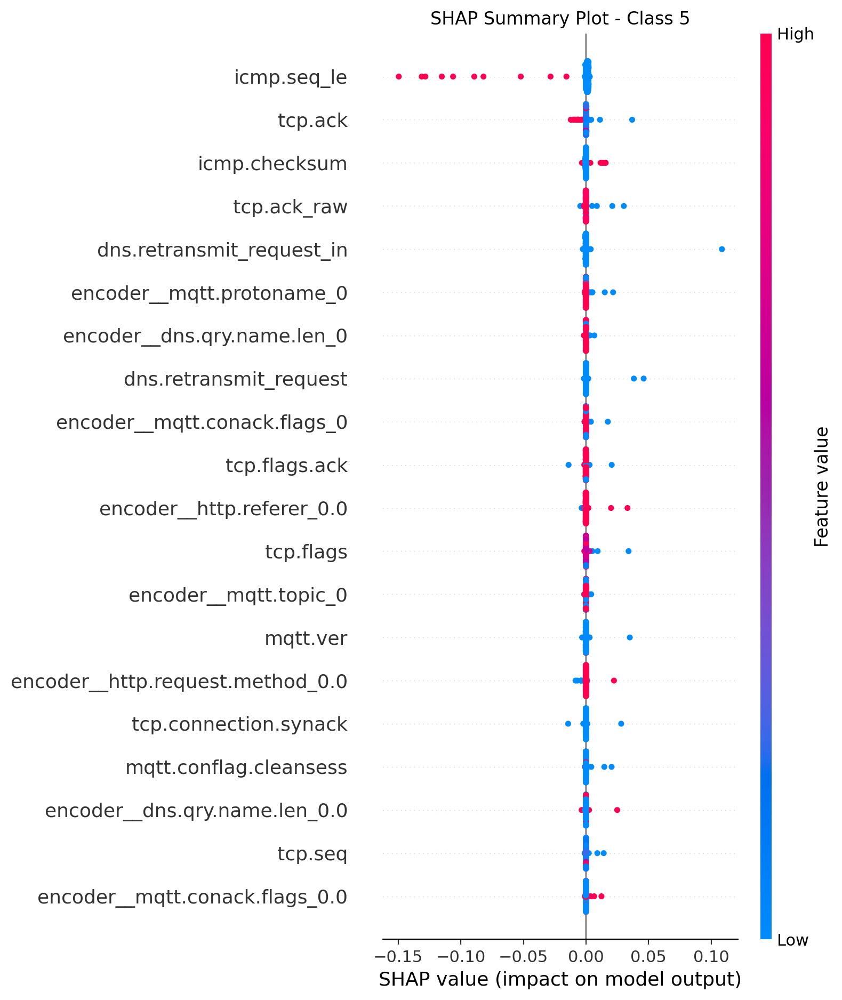

Creating waterfall plot for class 5...


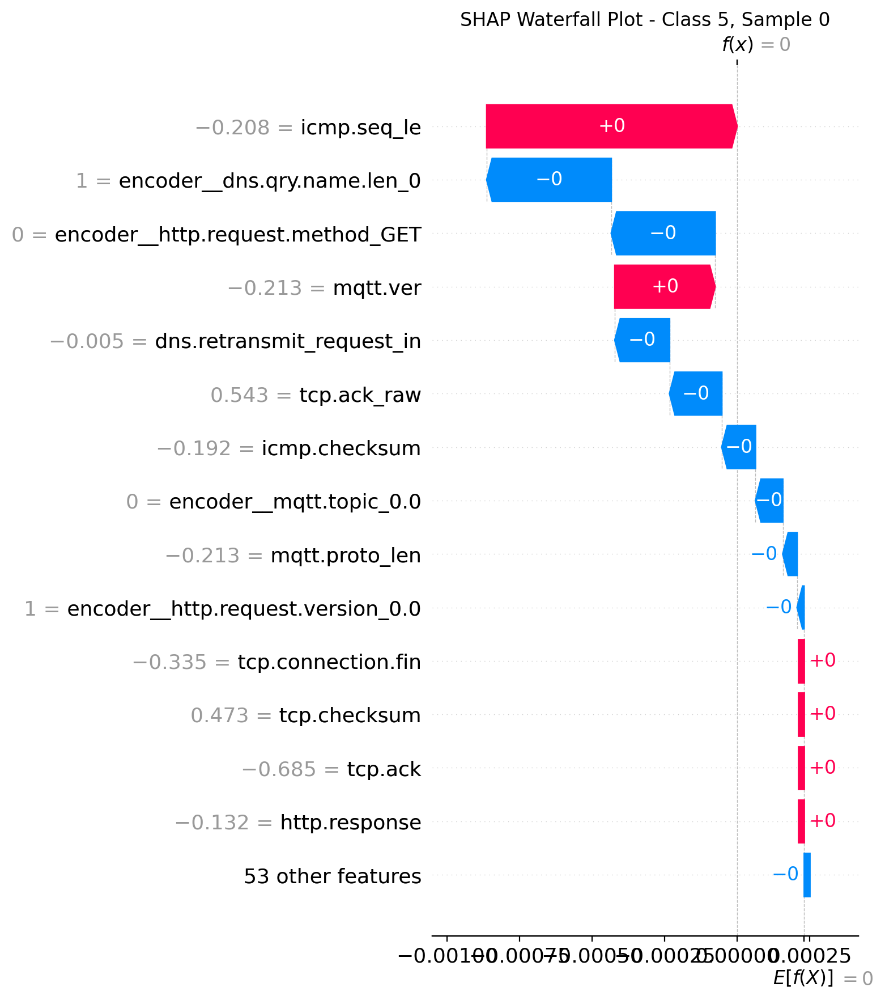


Explaining class 6...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 62.23it/s]


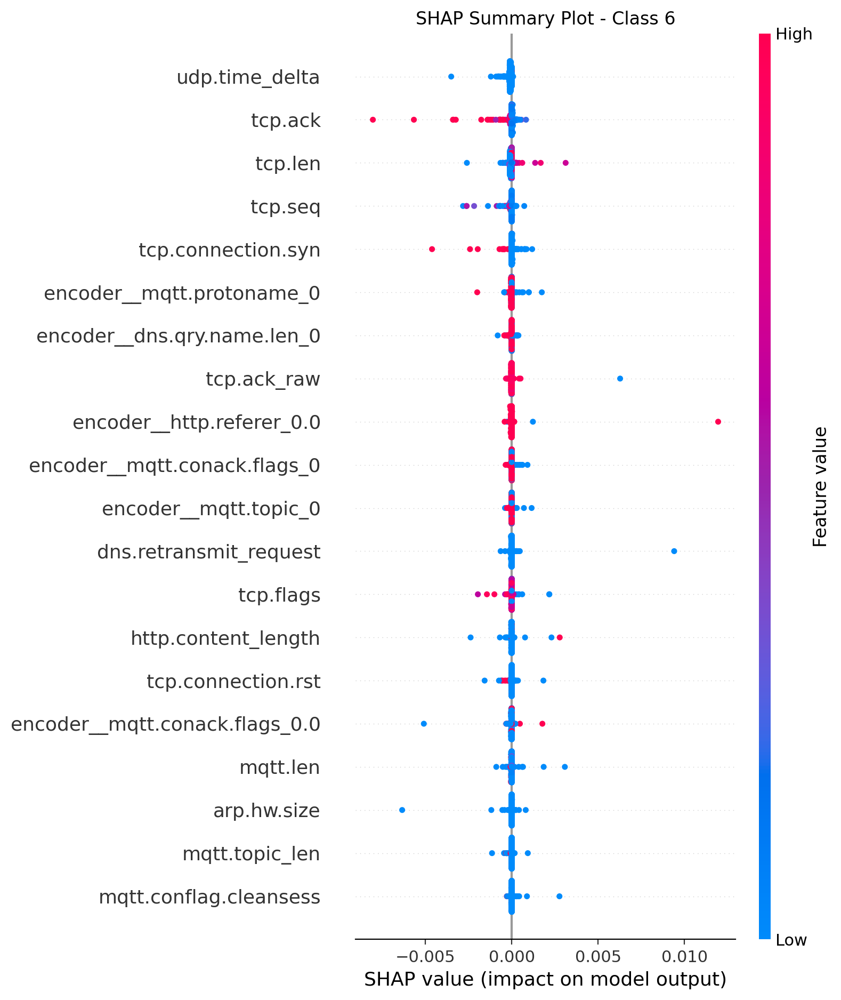

Creating waterfall plot for class 6...


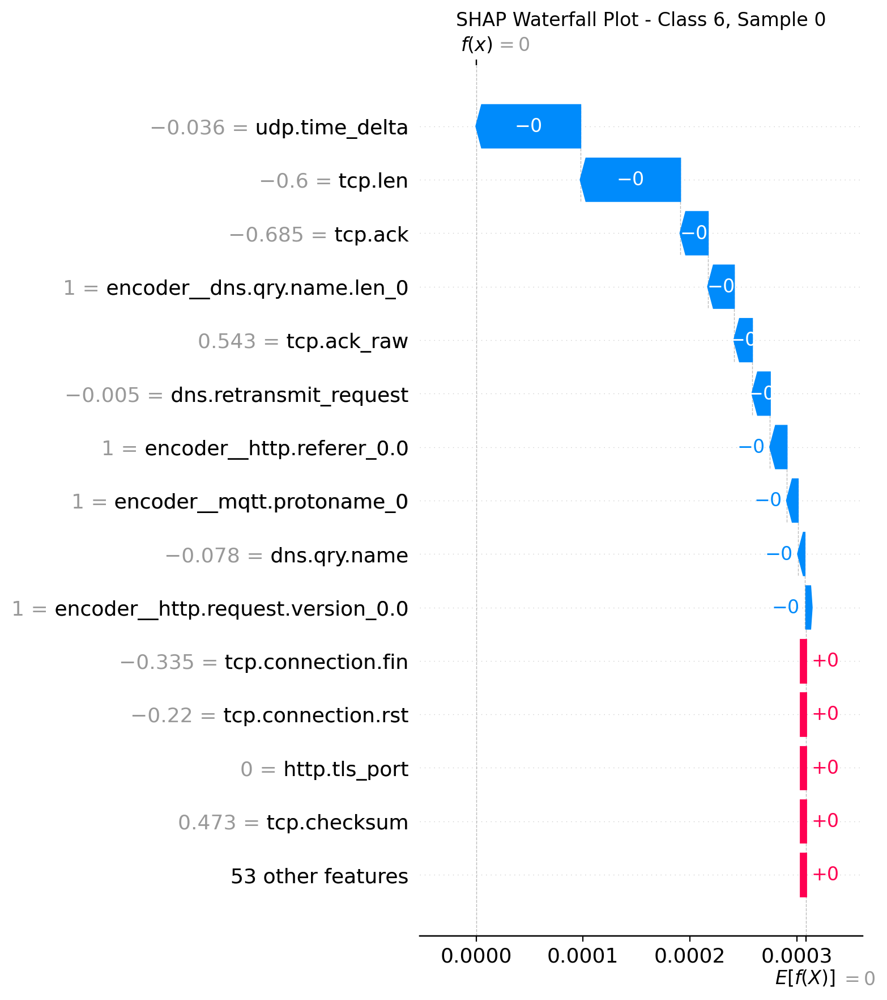


Explaining class 7...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 62.41it/s]


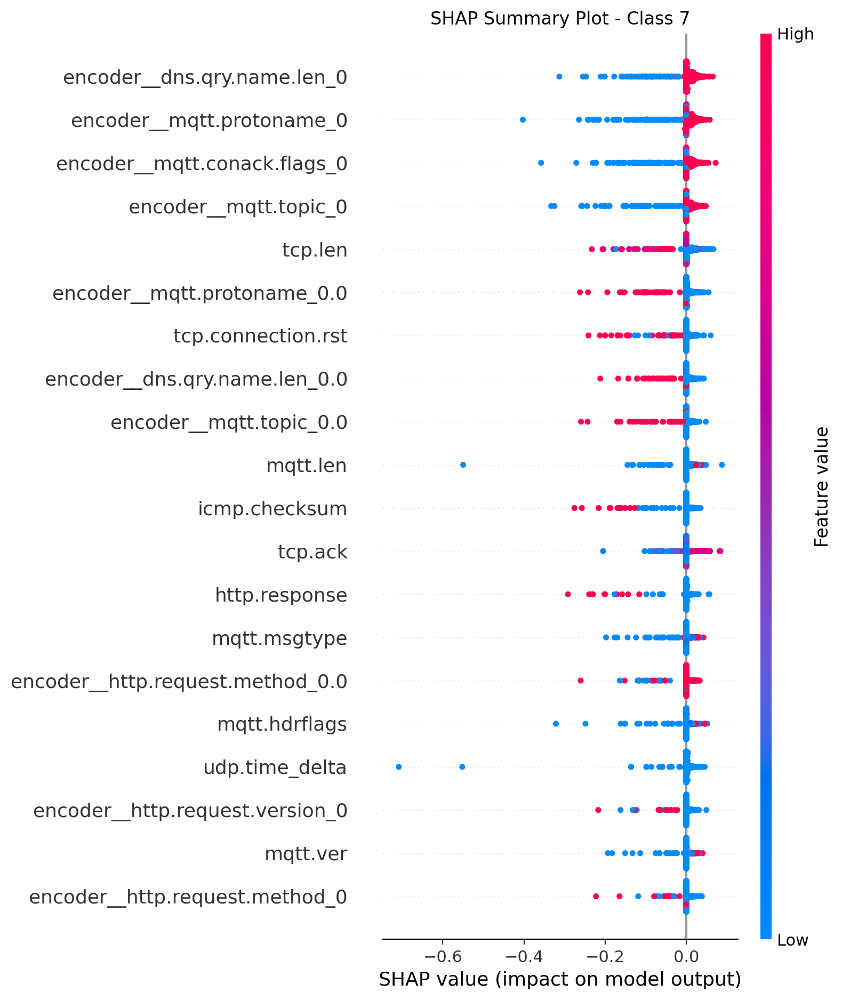

Creating waterfall plot for class 7...


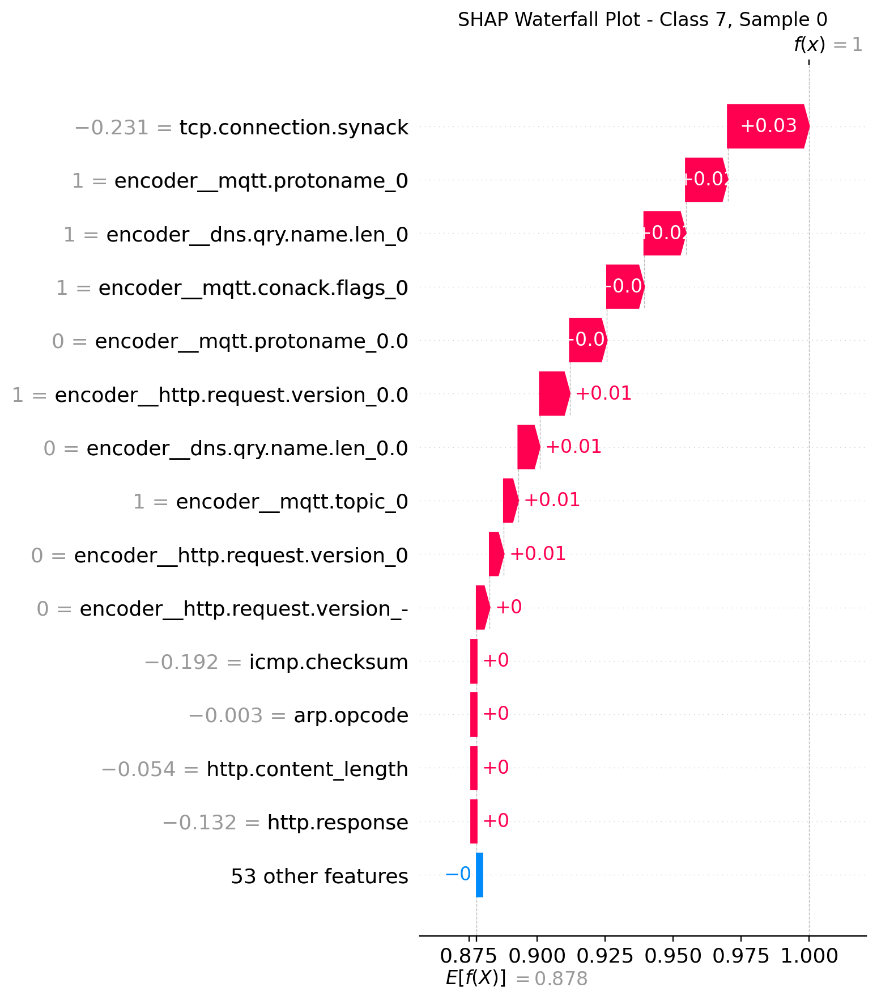


Explaining class 8...
Computing SHAP values...


100%|██████████| 1000/1000 [00:15<00:00, 62.97it/s]


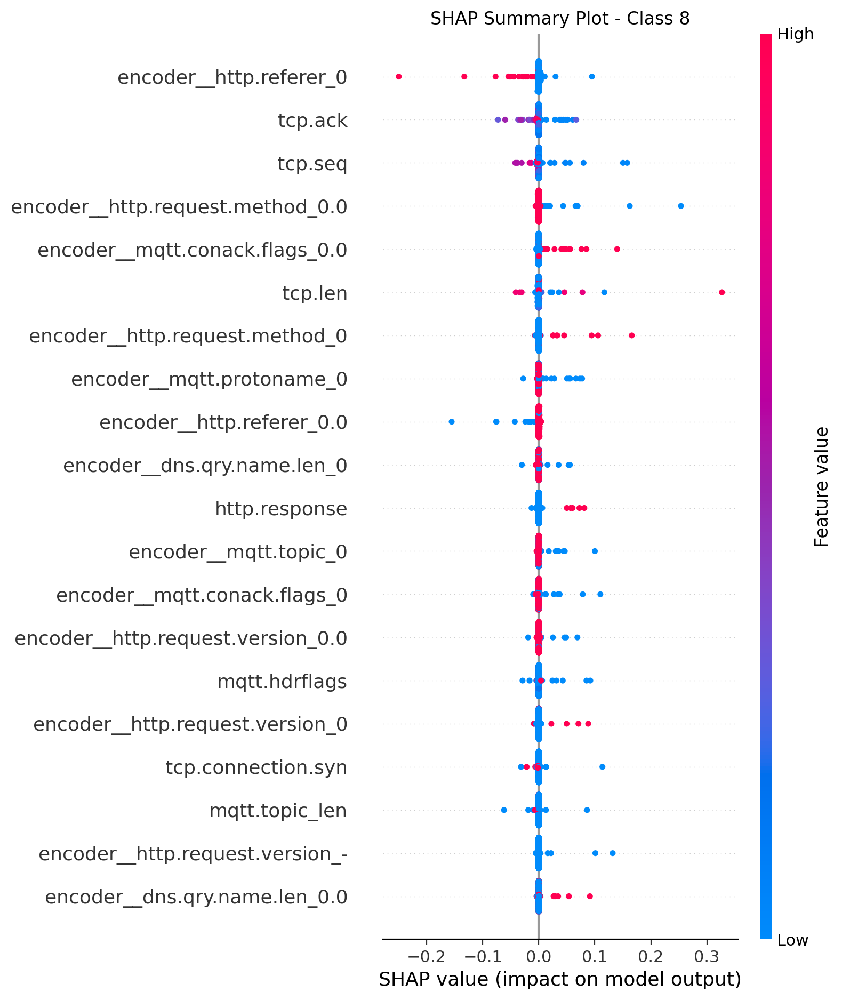

Creating waterfall plot for class 8...


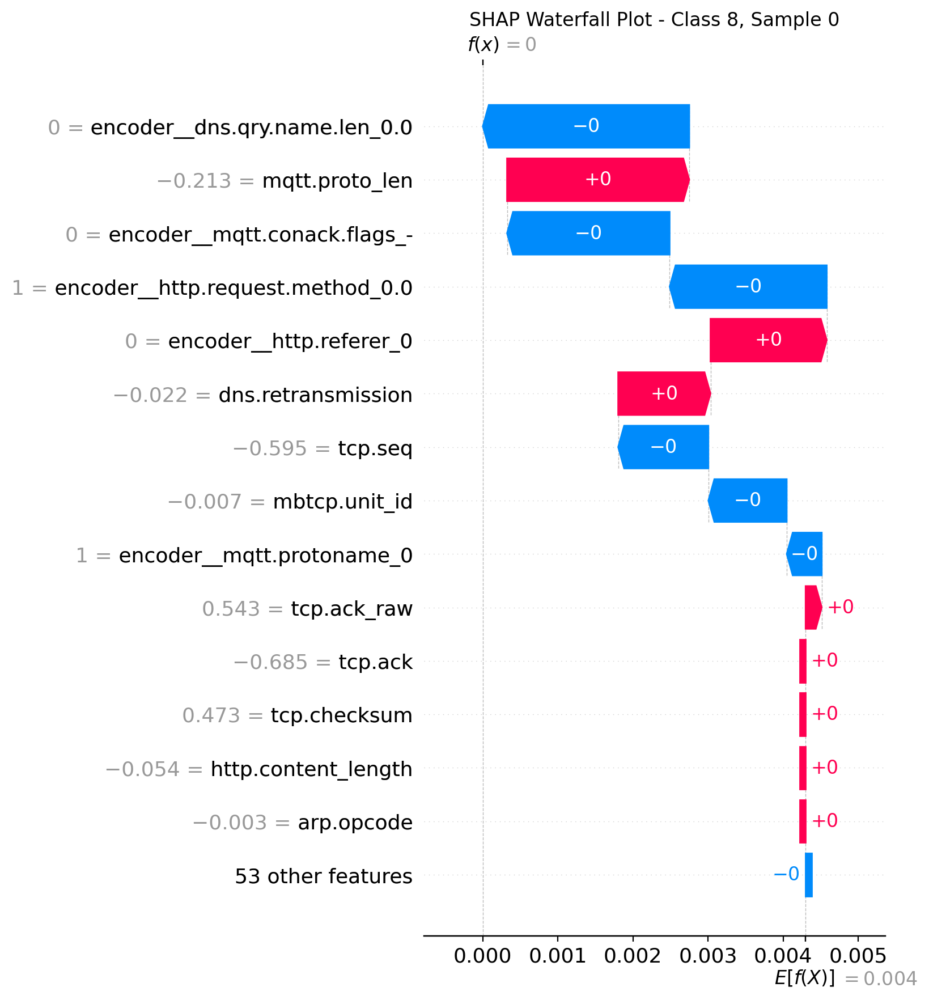


Explaining class 9...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 59.15it/s]


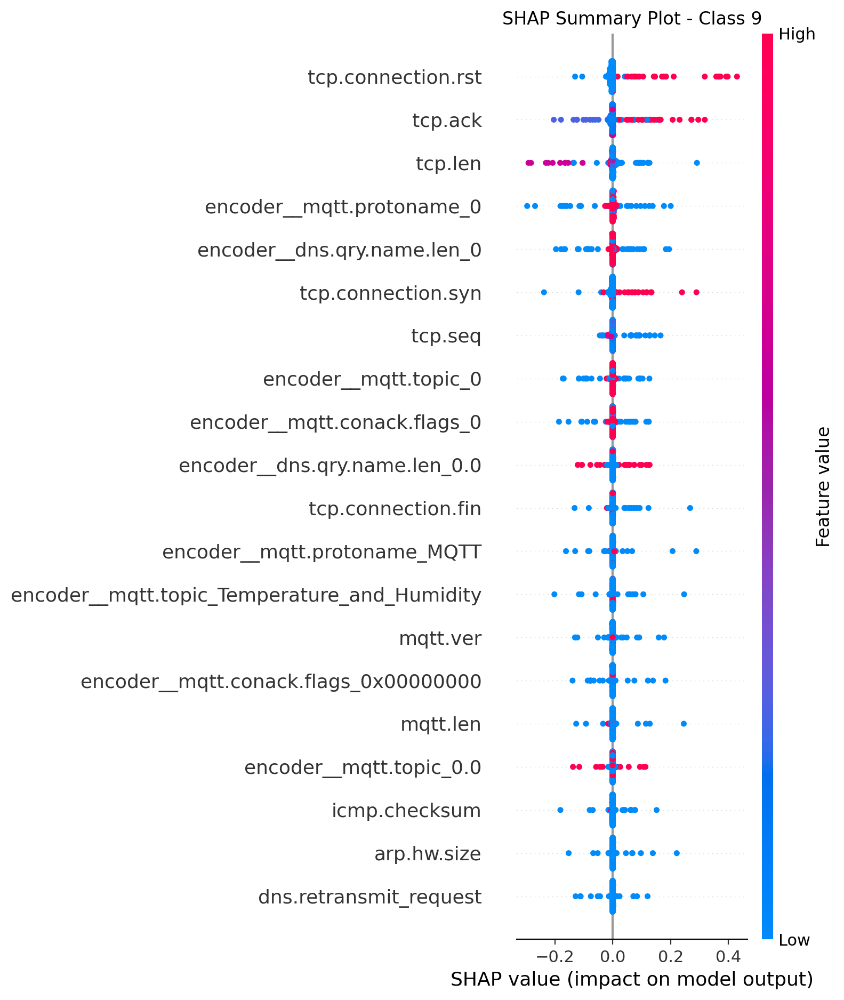

Creating waterfall plot for class 9...


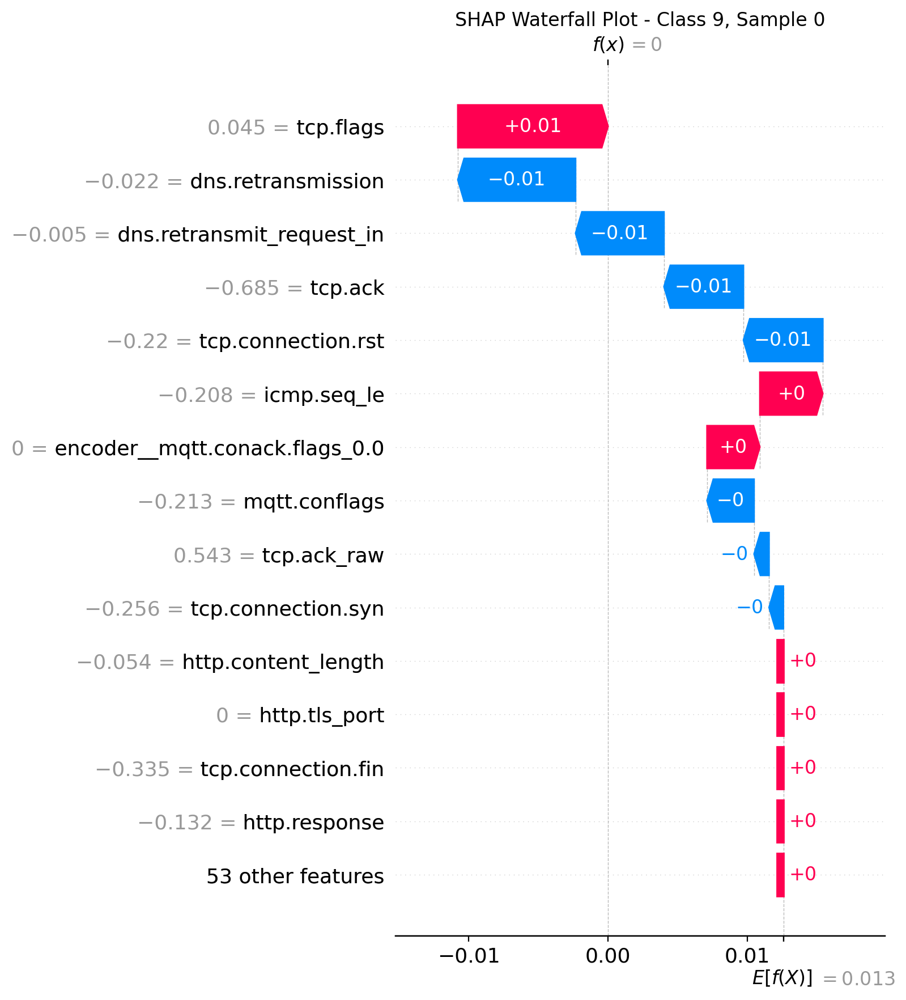


Explaining class 10...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 61.74it/s]


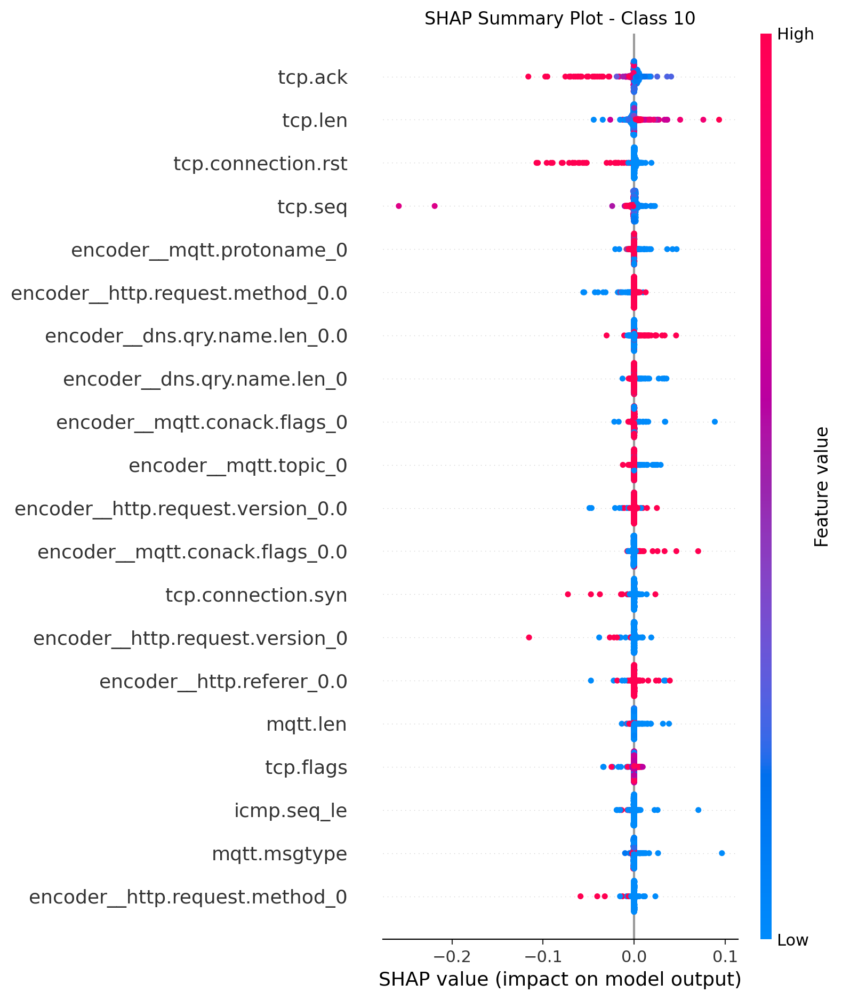

Creating waterfall plot for class 10...


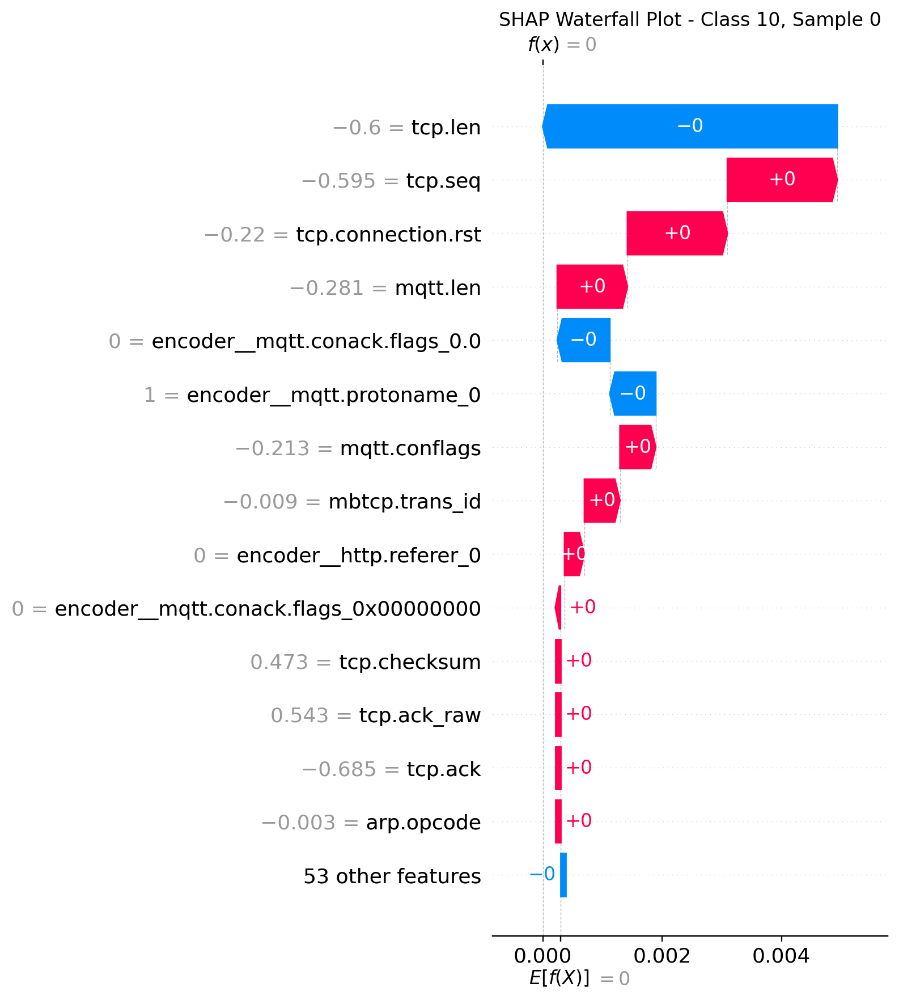


Explaining class 11...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 60.29it/s]


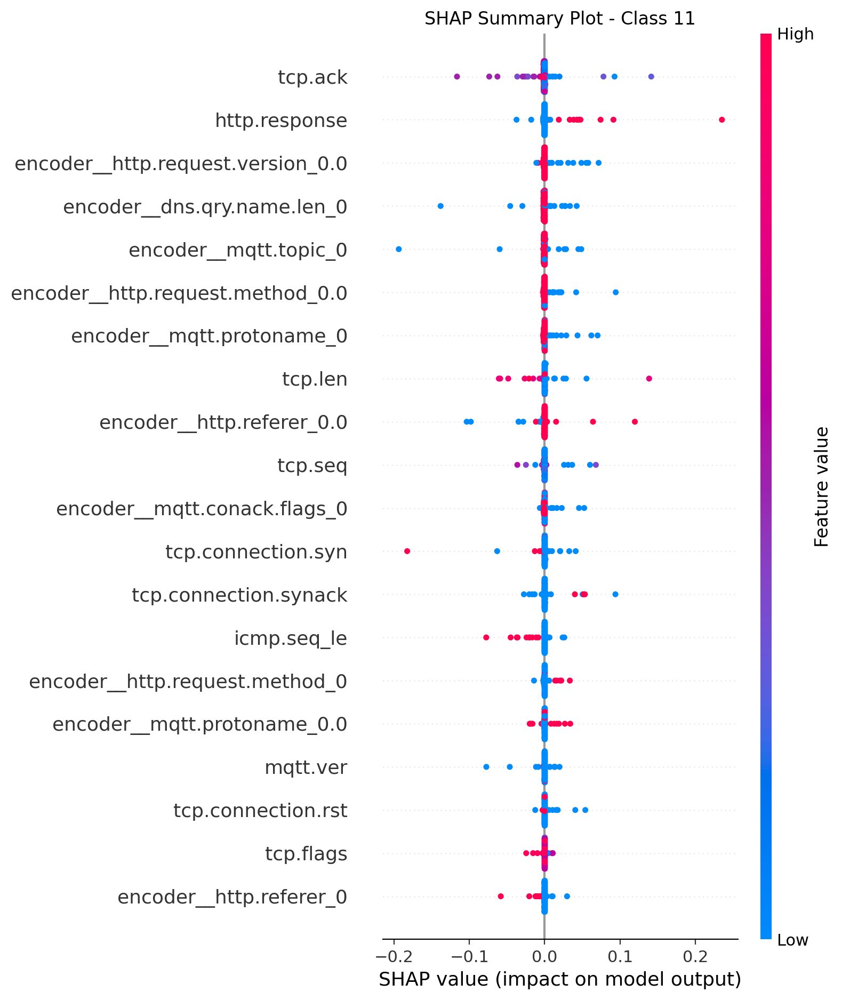

Creating waterfall plot for class 11...


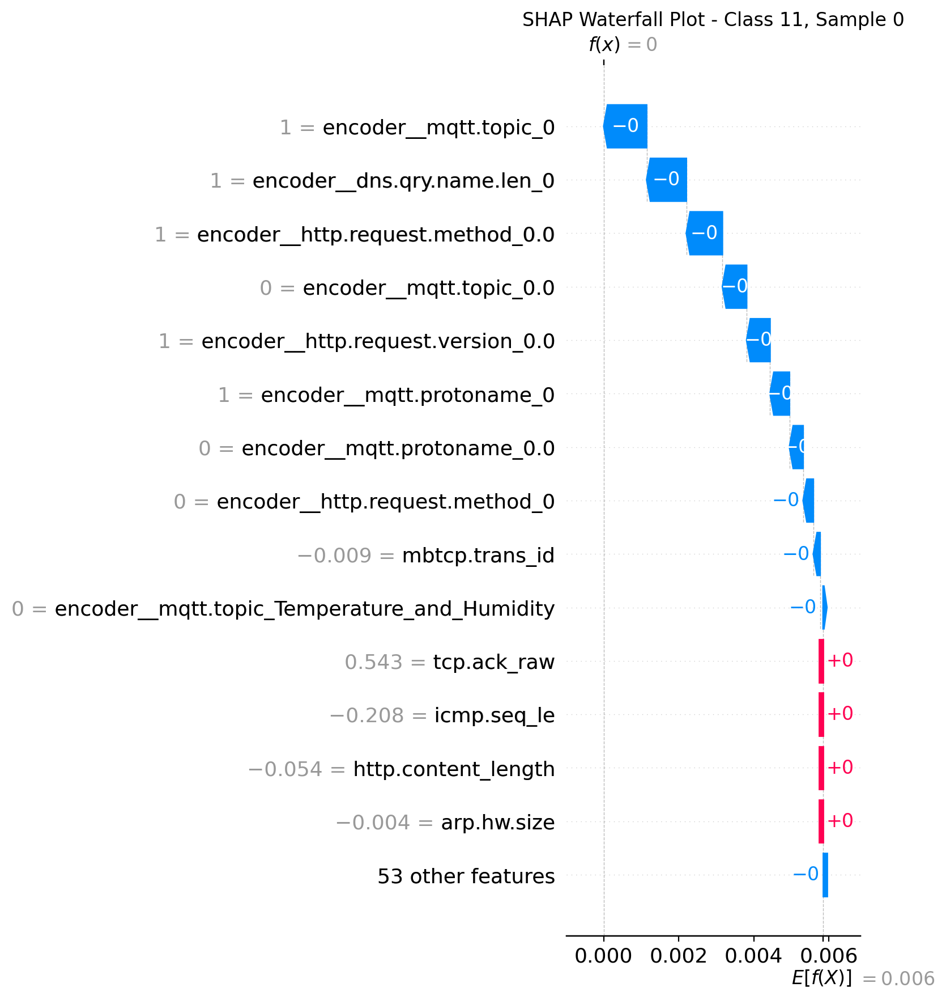


Explaining class 12...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 59.75it/s]


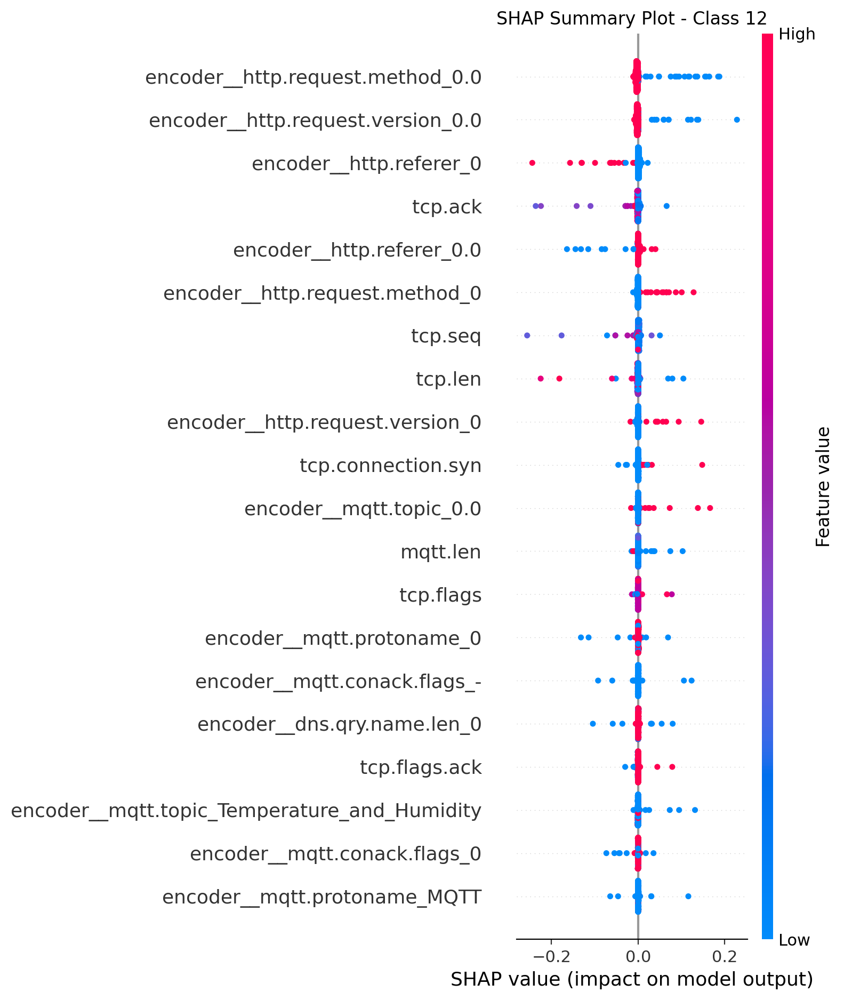

Creating waterfall plot for class 12...


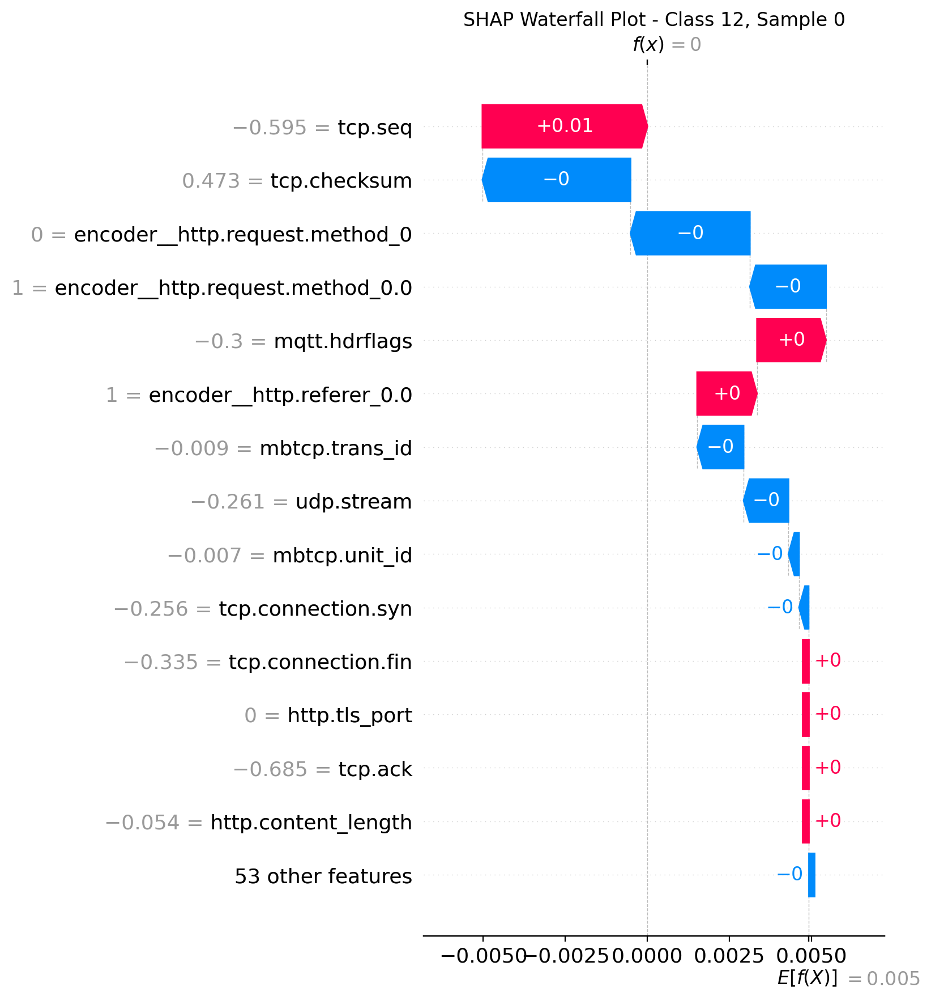


Explaining class 13...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 61.15it/s]


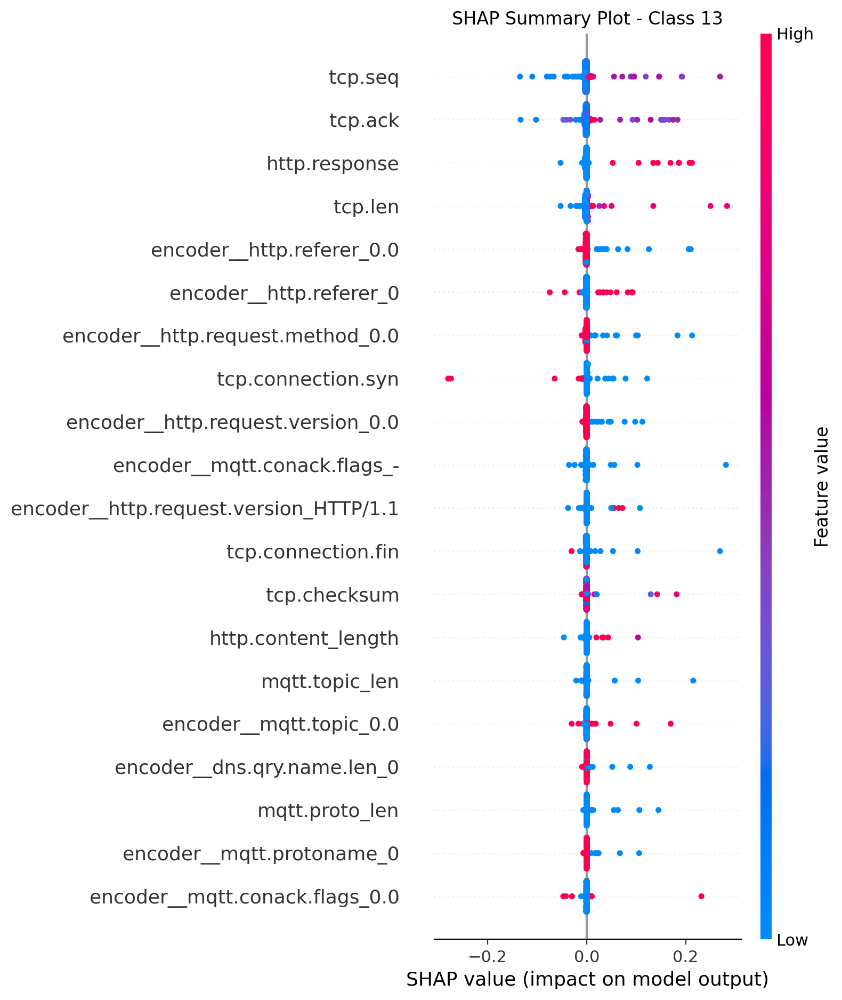

Creating waterfall plot for class 13...


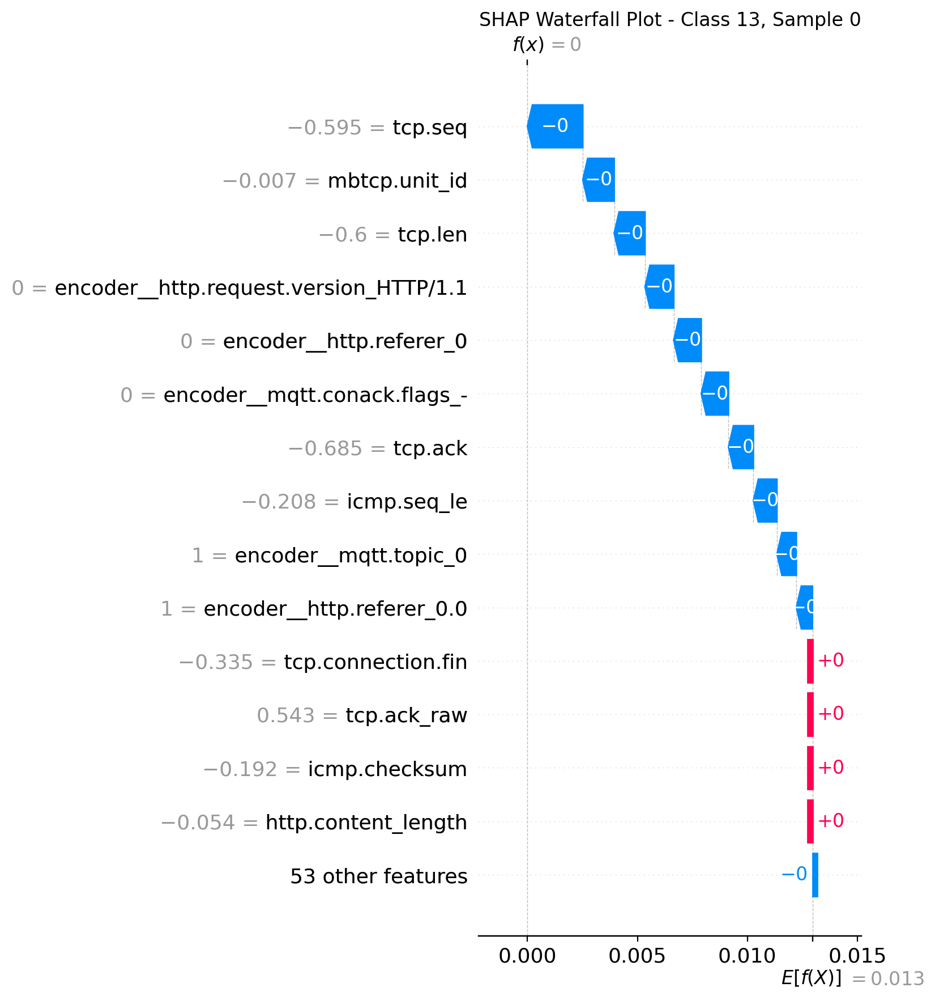


Explaining class 14...
Computing SHAP values...


100%|██████████| 1000/1000 [00:16<00:00, 59.67it/s]


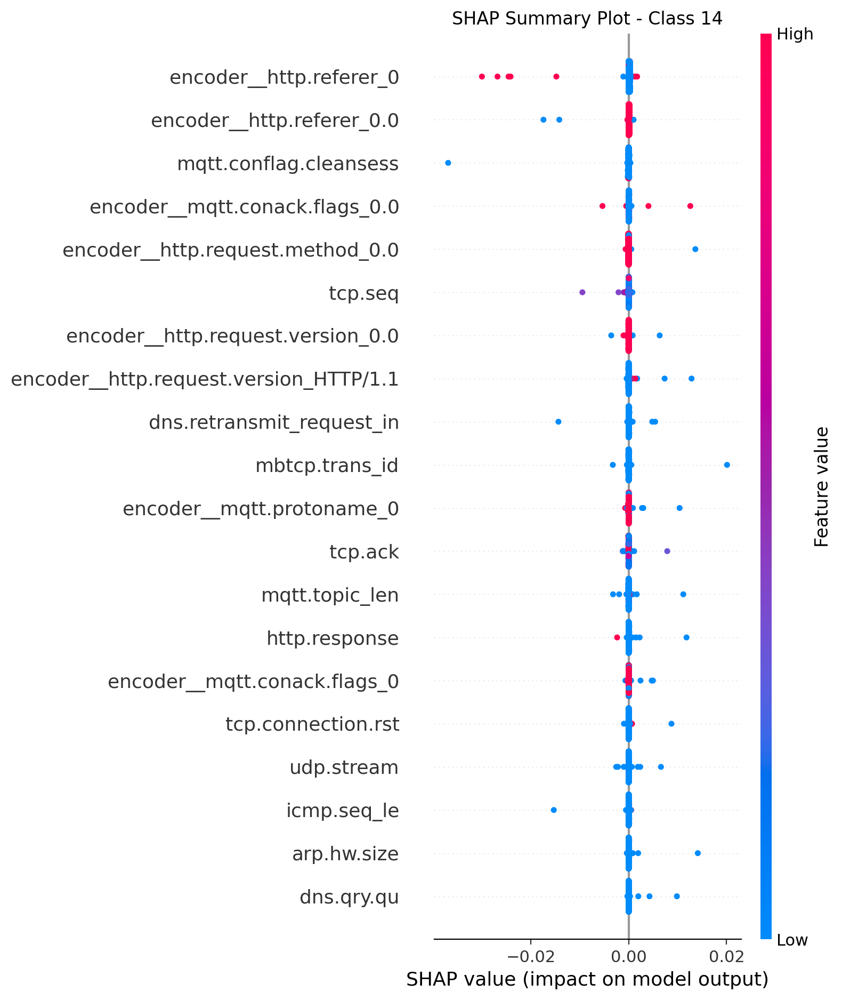

Creating waterfall plot for class 14...


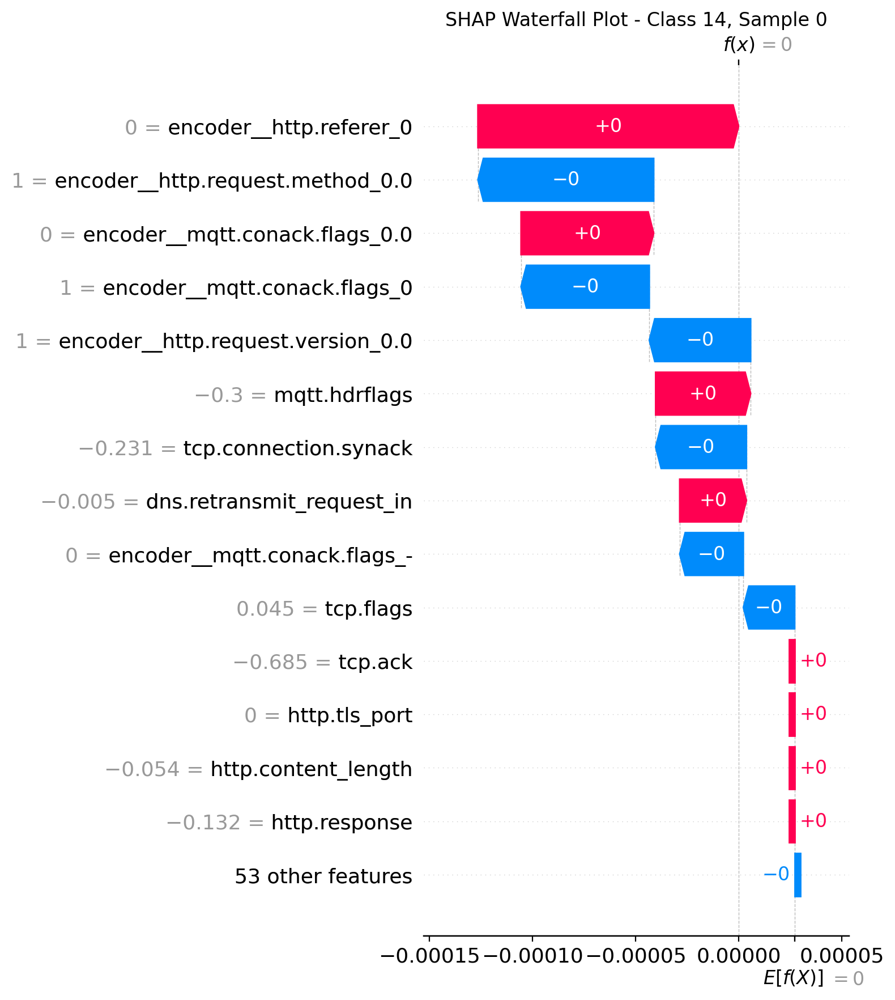


SHAP explanation generation completed!

=== Collecting SHAP values for comprehensive analysis ===
Computing SHAP values for class 0...


100%|██████████| 1000/1000 [00:16<00:00, 61.23it/s]


Computing SHAP values for class 1...


100%|██████████| 1000/1000 [00:15<00:00, 63.20it/s]


Computing SHAP values for class 2...


100%|██████████| 1000/1000 [00:15<00:00, 62.99it/s]


Computing SHAP values for class 3...


100%|██████████| 1000/1000 [00:15<00:00, 62.75it/s]


Computing SHAP values for class 4...


100%|██████████| 1000/1000 [00:15<00:00, 62.93it/s]


Computing SHAP values for class 5...


100%|██████████| 1000/1000 [00:15<00:00, 63.29it/s]


Computing SHAP values for class 6...


100%|██████████| 1000/1000 [00:16<00:00, 61.89it/s]


Computing SHAP values for class 7...


100%|██████████| 1000/1000 [00:16<00:00, 62.49it/s]


Computing SHAP values for class 8...


100%|██████████| 1000/1000 [00:16<00:00, 61.93it/s]


Computing SHAP values for class 9...


100%|██████████| 1000/1000 [00:16<00:00, 62.12it/s]


Computing SHAP values for class 10...


100%|██████████| 1000/1000 [00:15<00:00, 62.54it/s]


Computing SHAP values for class 11...


100%|██████████| 1000/1000 [00:15<00:00, 62.77it/s]


Computing SHAP values for class 12...


100%|██████████| 1000/1000 [00:16<00:00, 62.04it/s]


Computing SHAP values for class 13...


100%|██████████| 1000/1000 [00:15<00:00, 62.92it/s]


Computing SHAP values for class 14...


100%|██████████| 1000/1000 [00:15<00:00, 62.95it/s]


=== Comprehensive Feature Importance Analysis ===

--- Class 0 Feature Importance (ALL 67 features) ---
                                                                                   feature  importance
                                                                        tcp.connection.rst    0.012671
                                                                                   tcp.ack    0.010511
                                                                 encoder__mqtt.protoname_0    0.007273
                                                               encoder__dns.qry.name.len_0    0.006943
                                                                                   tcp.seq    0.006396
                                                              encoder__mqtt.conack.flags_0    0.005494
                                                                     encoder__mqtt.topic_0    0.004579
                                                                       

In [19]:
# === SHAP Explainability for Centralized Model ===
import shap
import numpy as np
import matplotlib.pyplot as plt

print(f"\nGenerating SHAP explanations...")

# Define prediction function for each class
def predict_class_prob(class_index):
    return lambda x: loaded_model.predict_proba(x)[:, class_index]

# Sample points to explain (reasonable size for demonstration)
sample_size = min(1000, len(X_test))  # Don't exceed available test data
X_explainer = X_test.sample(n=sample_size, random_state=42)

# === Use summarized background data for efficiency ===
# Reduce background size significantly for faster computation
background_size = 100
print(f"Creating background summary with {background_size} samples...")

# Option 1: K-means clustering (better representation of data distribution)
background_data = shap.kmeans(X_train, background_size)

# Option 2: Random sampling (faster but less representative)
# background_data = shap.sample(X_train, background_size)

# Get number of classes from model
n_classes = loaded_model.classes_.shape[0] if hasattr(loaded_model, 'classes_') else 2
print(f"Model has {n_classes} classes")

# Loop over all classes (or subset for demonstration)
classes_to_explain = min(15, n_classes)  # Limit to first 3 classes for demo
print(f"Explaining first {classes_to_explain} classes...")

for class_index in range(classes_to_explain):
    print(f"\nExplaining class {class_index}...")
    
    # Create Kernel SHAP explainer with summarized background
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        background_data
    )
    
    # Get SHAP values for the explained samples
    # Reduce nsamples for faster computation (100-300 is usually sufficient)
    print("Computing SHAP values...")
    shap_values = explainer.shap_values(X_explainer, nsamples=100)
    
    # Create summary plot
    plt.figure(figsize=(10, 6))
    shap.summary_plot(
        shap_values,
        X_explainer,
        feature_names=X_explainer.columns,
        plot_type="dot",
        show=False,  # Don't show immediately
        max_display=20  # Limit features shown
    )
    plt.title(f'SHAP Summary Plot - Class {class_index}')
    plt.tight_layout()
    plt.show()
    
    # Optional: Create waterfall plot for first few samples
    if len(X_explainer) > 0:
        print(f"Creating waterfall plot for class {class_index}...")
        plt.figure(figsize=(10, 6))
        shap.waterfall_plot(
            shap.Explanation(
                values=shap_values[0],  # First sample
                base_values=explainer.expected_value,
                data=X_explainer.iloc[0].values,
                feature_names=X_explainer.columns.tolist()
            ),
            max_display=15,
            show=False
        )
        plt.title(f'SHAP Waterfall Plot - Class {class_index}, Sample 0')
        plt.tight_layout()
        plt.show()

print("\nSHAP explanation generation completed!")

# === Additional Analysis Options ===

# Store SHAP values for all classes
all_shap_values = []
all_class_indices = []

print("\n=== Collecting SHAP values for comprehensive analysis ===")
# Re-run the explanation loop to collect all SHAP values
for class_index in range(classes_to_explain):
    print(f"Computing SHAP values for class {class_index}...")
    
    explainer = shap.KernelExplainer(
        predict_class_prob(class_index),
        background_data
    )
    
    shap_values = explainer.shap_values(X_explainer, nsamples=100)
    all_shap_values.append(shap_values)
    all_class_indices.append(class_index)

# Feature importance aggregation across all samples and classes
def analyze_comprehensive_feature_importance(all_shap_values, feature_names, class_indices):
    """Analyze overall feature importance across all classes and all explained features"""
    print("\n=== Comprehensive Feature Importance Analysis ===")
    
    # Individual class analysis (showing ALL features)
    for class_idx, shap_vals in zip(class_indices, all_shap_values):
        print(f"\n--- Class {class_idx} Feature Importance (ALL {len(feature_names)} features) ---")
        
        # Mean absolute SHAP values for this class
        mean_abs_shap = np.abs(shap_vals).mean(axis=0)
        
        # Create feature importance DataFrame
        importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': mean_abs_shap
        }).sort_values('importance', ascending=False)
        
        # Print all features with their importance
        print(importance_df.to_string(index=False))
        print(f"\nSummary for Class {class_idx}:")
        print(f"  - Total features: {len(importance_df)}")
        print(f"  - Mean importance: {importance_df['importance'].mean():.6f}")
        print(f"  - Max importance: {importance_df['importance'].max():.6f}")
        print(f"  - Min importance: {importance_df['importance'].min():.6f}")
        print("-" * 80)
    
    # Global feature importance across all classes
    print(f"\n--- Global Feature Importance Across All Classes ---")
    
    # Combine SHAP values from all classes
    combined_shap = np.concatenate(all_shap_values, axis=0)
    global_importance = np.abs(combined_shap).mean(axis=0)
    
    global_importance_df = pd.DataFrame({
        'feature': feature_names,
        'global_importance': global_importance
    }).sort_values('global_importance', ascending=False)
    
    print("Global feature ranking (averaged across all classes and samples):")
    print(global_importance_df.to_string(index=False))
    
    print(f"\nGlobal Summary:")
    print(f"  - Total features analyzed: {len(global_importance_df)}")
    print(f"  - Mean global importance: {global_importance_df['global_importance'].mean():.6f}")
    print(f"  - Most important feature: {global_importance_df.iloc[0]['feature']} ({global_importance_df.iloc[0]['global_importance']:.6f})")
    print(f"  - Least important feature: {global_importance_df.iloc[-1]['feature']} ({global_importance_df.iloc[-1]['global_importance']:.6f})")
    
    return global_importance_df

# Run comprehensive analysis
if len(all_shap_values) > 0:
    comprehensive_results = analyze_comprehensive_feature_importance(
        all_shap_values, 
        X_explainer.columns.tolist(), 
        all_class_indices
    )